In [388]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mplc
from matplotlib.lines import Line2D
from matplotlib.colors import Normalize, LinearSegmentedColormap
from matplotlib.ticker import LogFormatter
from matplotlib.ticker import ScalarFormatter
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
%matplotlib inline
import seaborn as sns
import os
import random
import pyreadr
import csv

from mpl_toolkits.basemap import Basemap
from scipy.stats import gaussian_kde
from scipy.optimize import curve_fit

from scipy.stats import gaussian_kde, binned_statistic
from scipy.stats import skew, kurtosis


# import descartes
import geopandas as gpd
import geodatasets
from shapely.geometry import Point, Polygon
import shapely.geometry
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error
import osmnx as ox
import pickle

import folium

from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score, mean_squared_error
from scipy.integrate import simps
from scipy import interpolate
import statsmodels.api as sm
import scipy.stats as stats

from meteostat import Point, Daily


%matplotlib inline

import networkx as nx
import collections

import rioxarray

import warnings
warnings.filterwarnings('ignore')


import os


# Define the power-law function
def power_law(x, a, b):
    return a * np.power(x, b)

# Define the linear function
def linear(x, a, b):
    return a + b * x

In [389]:
#STEP RESOLUTION DEGREES TO meters

from math import radians, cos, sin, asin, sqrt

def haversine(lon1, lat1, lon2, lat2):

    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371000 # Radius of earth in meters
    return c * r 

haversine(1,1,1.01,1)

1111.779911186028

# INFORMATION

In [390]:
net_type = 'drive'

In [391]:
T_type = 'mean'
# T_type = 'max'
# T_type = 'max_LST'

In [392]:
POPULATION = 'no'

In [393]:
PM = '25'

# CITIES

In [394]:
cities = [
    'Barcelona', 'Montpellier', 'Rome', 'Naples', 'Porto', 'Sevilla', 'Alicante', 'Valencia', 'Bologna', 'Padua', 'Turin',
    'Madrid', 'Murcia', 'Genoa', 'Milan', 'Lisbon', 'Palma_de_Mallorca', 'Split','Marseille', 'Palermo','Nice', 'Malaga', 'Bari', 

    'Antwerp', 'Amsterdam', 'Brussels', 'London', 'Paris', 'Luxembourg', 'Rotterdam', 'Lille', 'Basel', 'Birmingham', 'Nantes', 'Strasbourg',
    'Zurich', 'Frankfurt', 'Vienna', 'Munich', 'Bratislava', 'Prague', 'Geneva', 'Bordeaux', 'Utrecht', 
    'Liege', 'Bilbao', 'Charleroi', 'Wroclaw', 'Leipzig', 'Berlin', 'Hamburg', 'Lodz', 'Warsaw', 'Edinburgh', 
    'Glasgow', 'Cologne', 'Dusseldorf', 'Newcastle', 'Ghent', 'Dublin', 'Toulouse', 'Leeds', 'Lyon',

    'Tallinn','Reykjavik', 'Copenhagen', 'Goteborg', 'Helsinki', 'Stockholm', 'Oslo', 'Tartu', 'Riga', 'Klaipeda', 'Vilnius', 'Gdansk',

    'Sofia', 'Zagreb', 'Budapest', 'Szeged', 'Brasov', 'Bucharest', 'Ljubljana', 'Sarajevo', 'Gyor','Thessaloniki','Debrecen','Belgrado', 'Podgorica',
    'Trieste', 'Miskolc', 'Kosice', 'Krakow', 'Pecs', 'Varna', 'Skopje', 'Novi_Sad', 'Graz', 'Athens', 'Tirana', 'Cluj_Napoca', 
    
    'Accra', 'Addis_Abeba', 'Amman', 'Auckland', 'Bogota', 'Buenos_Aires', 'Cairo', 'Cape_Town', 'Chennai', 'Curitiba', 'Dakar', 'Dhaka', 'Dubai', 
    'Ho_Chi_Minh', 'Hong_Kong', 'Houston', 'Islamabad', 'Istanbul', 'Jakarta', 'Karachi', 'Lagos', 'Lima', 'Los_Angeles', 'Marrakesh', 'Medina', 
    'Melbourne', 'Mexico_City', 'Mogadishu', 'Moscow', 'Nairobi', 'Nanjing', 'New_York', 'Phoenix', 'Rabat', 'Salvador', 'Santiago', 'Singapore', 
    'Sydney', 'Teheran', 'Tokyo', 'Toronto', 'Tschwane']

# PLOT COLORS

In [395]:
colormap = plt.cm.Paired  
colors = [colormap(i) for i in np.linspace(0, 1,len(cities))]

# OPEN STREET NETWORK, POPULATION AND TEMPERATURE (binning)

In [396]:
size = '1000'
SIZE = 1000
cell_size_meters = 1000

In [397]:
# OPEN MERGE CSV FILES - datasets/intra_urban_climate_data_1000m.zip file for example

os.chdir(r'C:\Users\mduran\Desktop\PhD- Patterns and Dynamics in Urban Networks\1- DATA POLLUTION - Scaling laws, pdfs\RESULTS_GLOBAL\dataframes_2') 

pop_T_NETWORK_dic = {}

for city in cities:
    
    pop_T_NETWORK_dic[city] = pd.read_csv(city+'_pop_T'+T_type+'_PM'+PM+'_NETWORK_'+size+'.csv')

    if 'population' in pop_T_NETWORK_dic[city].columns:
            pop_T_NETWORK_dic[city].rename(columns={'population': 'popu'}, inplace=True)


In [398]:
for city in cities:

    pop_T_NETWORK_dic[city].replace([np.inf, -np.inf], np.nan, inplace=True)

    pop_T_NETWORK_dic[city] = pop_T_NETWORK_dic[city].dropna(subset=['T']).reset_index(drop=True) # specific column
    pop_T_NETWORK_dic[city] = pop_T_NETWORK_dic[city].dropna(subset=['node']).reset_index(drop=True)
    pop_T_NETWORK_dic[city] = pop_T_NETWORK_dic[city].dropna(subset=['PM'+PM]).reset_index(drop=True)


if POPULATION == 'yes':
    for city in cities:
        pop_T_NETWORK_dic[city] = pop_T_NETWORK_dic[city][pop_T_NETWORK_dic[city]['popu'] > 0] # avoid prblems when applying logn and logp --> represent 2-3% of the data points

# RESCALED DISTANCE

# OPEN RURAL TEMPERATURE and PM

In [399]:
# OPEN MERGE CSV FILES - datasets/intra_urban_climate_data_1000m.zip file for example

os.chdir(r'C:\Users\mduran\Desktop\PhD- Patterns and Dynamics in Urban Networks\1- DATA POLLUTION - Scaling laws, pdfs\RESULTS_GLOBAL\dataframes_2') 

OUTSIDE_TEMP_dic = {}

for city in cities:

    OUTSIDE_TEMP_dic[city] = pd.read_csv(city+'_pop_T'+T_type+'_PM'+PM+'_NETWORK_1000.csv')

    OUTSIDE_TEMP_dic[city].replace([np.inf, -np.inf], np.nan, inplace=True)
    OUTSIDE_TEMP_dic[city] = OUTSIDE_TEMP_dic[city].dropna(subset=['T']).reset_index(drop=True)
    OUTSIDE_TEMP_dic[city] = OUTSIDE_TEMP_dic[city][OUTSIDE_TEMP_dic[city]['node'] == 1]
    

In [400]:
# OPEN MERGE CSV FILES - datasets/intra_urban_climate_data_1000m.zip file for example

os.chdir(r'C:\Users\mduran\Desktop\PhD- Patterns and Dynamics in Urban Networks\1- DATA POLLUTION - Scaling laws, pdfs\RESULTS_GLOBAL\dataframes_2') 

OUTSIDE_PM_dic = {}

for city in cities:

    OUTSIDE_PM_dic[city] = pd.read_csv(city+'_pop_T'+T_type+'_PM'+PM+'_NETWORK_1000.csv')

    OUTSIDE_PM_dic[city].replace([np.inf, -np.inf], np.nan, inplace=True)
    OUTSIDE_PM_dic[city] = OUTSIDE_PM_dic[city].dropna(subset=['PM'+PM]).reset_index(drop=True)
    OUTSIDE_PM_dic[city] = OUTSIDE_PM_dic[city][OUTSIDE_PM_dic[city]['node'].isna()]

# deltaT and deltaPM CALCULATION

In [401]:
for city in cities:
    pop_T_NETWORK_dic[city]['deltaT'] = pop_T_NETWORK_dic[city]['T'] - OUTSIDE_TEMP_dic[city]['T'].mean()

In [402]:
for city in cities:
    pop_T_NETWORK_dic[city]['deltaPM'+PM] = pop_T_NETWORK_dic[city]['PM'+PM] - OUTSIDE_PM_dic[city]['PM'+PM].mean()

# OWN CLUSTERS

## T

In [408]:
clusters_T = { 
1: ['Barcelona', 'Toronto', 'Porto', 
  'Montpellier', 'Naples', 'Sevilla', 'Alicante', 'Valencia', 'Bologna', 'Padua', 'Turin', 'Madrid', 'Murcia', 'Milan', 'Lisbon', 'Palma_de_Mallorca',
  'Split', 'Antwerp', 'Amsterdam', 'Brussels', 'London', 'Paris', 'Luxembourg', 'Rotterdam', 'Lille', 'Birmingham', 'Nantes', 'Strasbourg',
  'Zurich', 'Frankfurt', 'Munich', 'Bratislava', 'Prague', 'Geneva', 'Bordeaux', 'Utrecht', 'Liege', 'Bilbao', 'Charleroi', 'Wroclaw',
  'Leipzig', 'Berlin', 'Hamburg', 'Warsaw', 'Edinburgh', 'Cologne', 'Dusseldorf', 'Newcastle', 'Dublin', 'Toulouse', 'Leeds',
  'Lyon', 'Tallinn', 'Reykjavik', 'Helsinki', 'Oslo', 'Klaipeda', 'Vilnius', 'Gdansk', 'Szeged', 'Brasov', 'Bucharest', 'Ljubljana',
  'Gyor', 'Debrecen', 'Belgrado', 'Miskolc', 'Kosice', 'Krakow', 'Pecs', 'Novi_Sad', 'Tirana', 'Cluj_Napoca', 'Bogota', 'Buenos_Aires',
  'Ho_Chi_Minh', 'Houston', 'Melbourne', 'Moscow', 'Nanjing', 'Salvador', 'Curitiba', 'Marrakesh'],

2: ['Bari', 'Chennai', 'Lodz', 'Ghent', 'Copenhagen', 'Goteborg', 'Stockholm', 'Tartu', 'Riga', 'Accra', 'Auckland', 'Dakar', 'Jakarta',
  'Karachi', 'Lagos', 'Mogadishu', 'Rabat', 'Tokyo'],

3: ['Rome', 'Istanbul', 'Cairo', 'Nairobi', 'Lima', 
  'Dhaka', 'Dubai', 'Genoa', 'Marseille', 'Palermo', 'Nice', 'Malaga', 'Basel', 'Vienna', 'Glasgow', 'Sofia', 'Zagreb', 'Budapest',
  'Sarajevo', 'Thessaloniki', 'Podgorica', 'Trieste', 'Varna', 'Skopje', 'Graz', 'Athens', 'Addis_Abeba', 'Cape_Town',
  'Hong_Kong', 'Islamabad', 'Los_Angeles', 'Medina', 'Mexico_City', 'New_York', 'Phoenix', 'Santiago', 'Singapore',
  'Teheran', 'Tschwane']            
}

# Print the clusters
for cluster_id, cities_sub in clusters_T.items():
    city_list_formatted = "', '".join(cities_sub)
    print(f"Cluster {cluster_id} cities_sub:\n'{city_list_formatted}'\n")

num_clusters = len(clusters_T)
print(f"Number of clusters: {num_clusters}")

# Choose a color palette
cluster_colors = { 1:'green', 2:'#0077b6', 3:'purple'}
# cluster_colors = { 1:'#a1c349', 2:'#0077b6', 3:'#a06cd5'} 
# cluster_colors = { 1:'#e57c04', 2:'#f3ca40', 3:'#f63e02'}

cluster_colors_hex = {cluster_id: mcolors.to_hex(color) for cluster_id, color in cluster_colors.items()}

# clusters

Cluster 1 cities_sub:
'Barcelona', 'Toronto', 'Porto', 'Montpellier', 'Naples', 'Sevilla', 'Alicante', 'Valencia', 'Bologna', 'Padua', 'Turin', 'Madrid', 'Murcia', 'Milan', 'Lisbon', 'Palma_de_Mallorca', 'Split', 'Antwerp', 'Amsterdam', 'Brussels', 'London', 'Paris', 'Luxembourg', 'Rotterdam', 'Lille', 'Birmingham', 'Nantes', 'Strasbourg', 'Zurich', 'Frankfurt', 'Munich', 'Bratislava', 'Prague', 'Geneva', 'Bordeaux', 'Utrecht', 'Liege', 'Bilbao', 'Charleroi', 'Wroclaw', 'Leipzig', 'Berlin', 'Hamburg', 'Warsaw', 'Edinburgh', 'Cologne', 'Dusseldorf', 'Newcastle', 'Dublin', 'Toulouse', 'Leeds', 'Lyon', 'Tallinn', 'Reykjavik', 'Helsinki', 'Oslo', 'Klaipeda', 'Vilnius', 'Gdansk', 'Szeged', 'Brasov', 'Bucharest', 'Ljubljana', 'Gyor', 'Debrecen', 'Belgrado', 'Miskolc', 'Kosice', 'Krakow', 'Pecs', 'Novi_Sad', 'Tirana', 'Cluj_Napoca', 'Bogota', 'Buenos_Aires', 'Ho_Chi_Minh', 'Houston', 'Melbourne', 'Moscow', 'Nanjing', 'Salvador', 'Curitiba', 'Marrakesh'

Cluster 2 cities_sub:
'Bari', 'Chennai'

## PM

In [409]:
clusters_PM = {
1: ['Barcelona', 'Rome', 'Medina', 'Naples', 'Porto', 'Alicante', 
    'Madrid', 'Murcia', 'Genoa', 'Milan', 'Lisbon', 'Padua', 'Bologna', 'Valencia', 'Palma_de_Mallorca', 'Split', 'Marseille', 'Nice', 'Malaga', 
    'Bari', 'London', 'Paris', 'Zurich', 'Munich', 'Geneva', 'Bilbao', 'Edinburgh', 'Dublin', 'Lyon', 'Tallinn', 'Reykjavik', 'Helsinki', 'Hong_Kong', 
    'Auckland', 'Goteborg', 'Stockholm', 'Oslo', 'Riga', 'Klaipeda', 'Vilnius', 'Gdansk', 'Sofia', 'Zagreb', 'Brasov', 'Bucharest', 'Sarajevo', 
    'Thessaloniki', 'Belgrado', 'Podgorica', 'Trieste', 'Kosice', 'Krakow', 'Varna', 'Skopje', 'Novi_Sad', 'Athens', 'Tirana', 'Cluj_Napoca', 
    'Bogota', 'Chennai', 'Houston', 'Istanbul', 'Marrakesh', 'Mogadishu', 'Moscow', 'Nanjing', 'Phoenix', 'Rabat', 'Salvador', 'Singapore', 'Tokyo', 
    'Toronto', 'Tschwane'],
2: ['Montpellier', 'Luxembourg', 'Sevilla', 'Antwerp', 'Amsterdam', 'Brussels', 'Rotterdam', 'Lille', 'Basel', 'Birmingham', 'Nantes', 'Strasbourg',
  'Frankfurt', 'Vienna', 'Bratislava', 'Prague', 'Bordeaux', 'Utrecht', 'Liege', 'Charleroi', 'Wroclaw', 'Leipzig', 'Berlin', 'Hamburg', 'Lodz',
  'Warsaw', 'Glasgow', 'Cologne', 'Dusseldorf', 'Newcastle', 'Ghent', 'Toulouse', 'Leeds', 'Tartu', 'Budapest', 'Szeged', 'Ljubljana', 'Gyor',
  'Debrecen', 'Miskolc', 'Pecs', 'Graz'],
3: ['Addis_Abeba', 'Curitiba', 'Lagos', 'Lima', 'Santiago', 
    'Dakar', 'Accra', 'Teheran', 'Cairo', 'Amman', 'Dhaka', 'Nairobi',  'Ho_Chi_Minh', 'Buenos_Aires', 'Jakarta',  'Dubai',   'Palermo',  'Cape_Town']}

                

# Print the clusters
for cluster_id, cities_sub in clusters_PM.items():
    city_list_formatted = "', '".join(cities_sub)
    print(f"Cluster {cluster_id} cities_sub:\n'{city_list_formatted}'\n")

num_clusters = len(clusters_PM)
print(f"Number of clusters: {num_clusters}")

# Choose a color palette
cluster_colors = { 1:'green', 2:'#0077b6', 3:'purple'}
# cluster_colors = {1:'#0077b6', 2:'#ef6351', 3:'#a06cd5', 4:'#a1c349'}
# cluster_colors = { 1:'#c7ac92', 2:'#d4e09b', 3:'#828c51', 4:'#94a89a'}

cluster_colors_hex = {cluster_id: mcolors.to_hex(color) for cluster_id, color in cluster_colors.items()}

Cluster 1 cities_sub:
'Barcelona', 'Rome', 'Medina', 'Naples', 'Porto', 'Alicante', 'Madrid', 'Murcia', 'Genoa', 'Milan', 'Lisbon', 'Padua', 'Bologna', 'Valencia', 'Palma_de_Mallorca', 'Split', 'Marseille', 'Nice', 'Malaga', 'Bari', 'London', 'Paris', 'Zurich', 'Munich', 'Geneva', 'Bilbao', 'Edinburgh', 'Dublin', 'Lyon', 'Tallinn', 'Reykjavik', 'Helsinki', 'Hong_Kong', 'Auckland', 'Goteborg', 'Stockholm', 'Oslo', 'Riga', 'Klaipeda', 'Vilnius', 'Gdansk', 'Sofia', 'Zagreb', 'Brasov', 'Bucharest', 'Sarajevo', 'Thessaloniki', 'Belgrado', 'Podgorica', 'Trieste', 'Kosice', 'Krakow', 'Varna', 'Skopje', 'Novi_Sad', 'Athens', 'Tirana', 'Cluj_Napoca', 'Bogota', 'Chennai', 'Houston', 'Istanbul', 'Marrakesh', 'Mogadishu', 'Moscow', 'Nanjing', 'Phoenix', 'Rabat', 'Salvador', 'Singapore', 'Tokyo', 'Toronto', 'Tschwane'

Cluster 2 cities_sub:
'Montpellier', 'Luxembourg', 'Sevilla', 'Antwerp', 'Amsterdam', 'Brussels', 'Rotterdam', 'Lille', 'Basel', 'Birmingham', 'Nantes', 'Strasbourg', 'Frankfurt', 'V

# OPEN LOG LINEAR FIT MODEL PARAMETERS

In [410]:
for city in cities:

    pop_T_NETWORK_dic[city]['logpopu'] = np.log(pop_T_NETWORK_dic[city]['popu']) 
    pop_T_NETWORK_dic[city]['lognode'] = np.log(pop_T_NETWORK_dic[city]['node']) 

## STREET NETWORK

In [411]:
# OPEN coefficients CSV FILES - datasets/log_coefficients_street_network_1000m.zip and datasets/log_coefficients_population_1000m.zip files for example

os.chdir(r'C:\Users\mduran\Desktop\PhD- Patterns and Dynamics in Urban Networks\1- DATA POLLUTION - Scaling laws, pdfs\RESULTS_GLOBAL\dataframes_2') 

coefficients_T_dic = {}
coefficients_PM_dic = {}

for city in cities:
    
    coefficients_T_dic[city] = pd.read_csv(city+'_coefficients_logn_deltaT_'+T_type+'_'+size+'.csv')  
    coefficients_PM_dic[city] = pd.read_csv(city+'_coefficients_logn_PM'+PM+'_'+size+'.csv') 

os.chdir(r'C:\Users\mduran\Desktop\PhD- Patterns and Dynamics in Urban Networks\1- DATA POLLUTION - Scaling laws, pdfs\RESULTS_GLOBAL')

In [412]:
BETAs_node = []
ALPHAs_node = []
R2s_node = []

for city in cities:
    BETAs_node.append(coefficients_PM_dic[city]['slope'][0])
    ALPHAs_node.append(coefficients_PM_dic[city]['intersection'][0])
    R2s_node.append(coefficients_PM_dic[city]['R2'][0])

In [413]:
BETAs_node_T = []
ALPHAs_node_T = []
R2s_node_T = []

for city in cities:
    BETAs_node_T.append(coefficients_T_dic[city]['slope'][0])
    ALPHAs_node_T.append(coefficients_T_dic[city]['intersection'][0])
    R2s_node_T.append(coefficients_T_dic[city]['R2'][0])

In [414]:
std_residuals_dic = {}
std_RESIDUALS_node = []
std_logn_dic = {}

for city in cities:
    
    T_predicted = coefficients_PM_dic[city]['intersection'][0] + coefficients_PM_dic[city]['slope'][0] * pop_T_NETWORK_dic[city]['lognode']
    residuals = pop_T_NETWORK_dic[city]['PM'+PM] - T_predicted
    
    std_residuals_dic[city] = np.std(residuals)
    std_RESIDUALS_node.append(np.std(residuals))
    
    std_logn_dic[city] = np.sqrt(coefficients_PM_dic[city]['slope'][0]**2*pop_T_NETWORK_dic[city]['lognode'].std()**2 + std_residuals_dic[city]**2)

In [415]:
ratios_residual = []
ratios_no_residual = []

for city in cities:
    ratios_residual.append(std_logn_dic[city]/pop_T_NETWORK_dic[city]['PM'+PM].std())
    ratios_no_residual.append(pop_T_NETWORK_dic[city]['lognode'].std()/pop_T_NETWORK_dic[city]['PM'+PM].std())

In [416]:
std_residuals_dic_T = {}
std_RESIDUALS_node_T = []

for city in cities:
    
    T_predicted = coefficients_T_dic[city]['intersection'][0] + coefficients_T_dic[city]['slope'][0] * pop_T_NETWORK_dic[city]['lognode']
    residuals = pop_T_NETWORK_dic[city]['T'] - T_predicted
    
    std_residuals_dic_T[city] = np.std(residuals)
    std_RESIDUALS_node_T.append(np.std(residuals))

In [417]:
# -----------------------------
# 3. Collecting BETAs, ALPHAs, R2s per Cluster for PM and T data
# -----------------------------

# Initialize dictionaries to hold BETAs, ALPHAs, R2s for each cluster
BETAs_PM = {cluster_id: [] for cluster_id in clusters_PM}
BETAs_T = {cluster_id: [] for cluster_id in clusters_T}
ALPHAs_PM = {cluster_id: [] for cluster_id in clusters_PM}
ALPHAs_T = {cluster_id: [] for cluster_id in clusters_T}
R2s_PM = {cluster_id: [] for cluster_id in clusters_PM}
R2s_T = {cluster_id: [] for cluster_id in clusters_T}

# Populate BETAs, ALPHAs, R2s for both PM and T data
for cluster_id, city_list in clusters_PM.items():
    for city in city_list:
        coef_PM = coefficients_PM_dic.get(city)  # For PM data
        
        # For PM data
        if coef_PM is not None and not coef_PM.empty:
            slope_PM = coef_PM['slope'].iloc[0]
            intercept_PM = coef_PM['intersection'].iloc[0]
            R2_PM = coef_PM['R2'].iloc[0]
            if pd.notna(slope_PM) and pd.notna(intercept_PM) and pd.notna(R2_PM):
                BETAs_PM[cluster_id].append(slope_PM)
                ALPHAs_PM[cluster_id].append(intercept_PM)
                R2s_PM[cluster_id].append(R2_PM)
            else:
                print(f"Warning: Missing PM coefficients for {city} in Cluster {cluster_id}.")
        else:
            print(f"Warning: No PM coefficients data for {city} in Cluster {cluster_id}.")

for cluster_id, city_list in clusters_T.items():
    for city in city_list:
        coef_T = coefficients_T_dic.get(city)    # For T data
        
        # For T data
        if coef_T is not None and not coef_T.empty:
            slope_T = coef_T['slope'].iloc[0]
            intercept_T = coef_T['intersection'].iloc[0]
            R2_T = coef_T['R2'].iloc[0]
            if pd.notna(slope_T) and pd.notna(intercept_T) and pd.notna(R2_T):
                BETAs_T[cluster_id].append(slope_T)
                ALPHAs_T[cluster_id].append(intercept_T)
                R2s_T[cluster_id].append(R2_T)
            else:
                print(f"Warning: Missing T coefficients for {city} in Cluster {cluster_id}.")
        else:
            print(f"Warning: No T coefficients data for {city} in Cluster {cluster_id}.")

# -----------------------------
# 4. Calculating Mean and Standard Deviation of BETAs and ALPHAs per Cluster for PM and T
# -----------------------------

mean_BETAs_PM = {}
std_BETAs_PM = {}
mean_BETAs_T = {}
std_BETAs_T = {}
mean_ALPHAs_PM = {}
std_ALPHAs_PM = {}
mean_ALPHAs_T = {}
std_ALPHAs_T = {}

for cluster_id in clusters_PM:
    # For PM data
    if BETAs_PM[cluster_id]:
        mean_BETAs_PM[cluster_id] = np.mean(BETAs_PM[cluster_id])
        std_BETAs_PM[cluster_id] = np.std(BETAs_PM[cluster_id])
    else:
        mean_BETAs_PM[cluster_id] = np.nan
        std_BETAs_PM[cluster_id] = np.nan
        print(f"Warning: No BETAs_PM available for Cluster {cluster_id}.")

    if ALPHAs_PM[cluster_id]:
        mean_ALPHAs_PM[cluster_id] = np.mean(ALPHAs_PM[cluster_id])
        std_ALPHAs_PM[cluster_id] = np.std(ALPHAs_PM[cluster_id])
    else:
        mean_ALPHAs_PM[cluster_id] = np.nan
        std_ALPHAs_PM[cluster_id] = np.nan
        print(f"Warning: No ALPHAs_PM available for Cluster {cluster_id}.")

for cluster_id in clusters_T:
    # For T data
    if BETAs_T[cluster_id]:
        mean_BETAs_T[cluster_id] = np.mean(BETAs_T[cluster_id])
        std_BETAs_T[cluster_id] = np.std(BETAs_T[cluster_id])
    else:
        mean_BETAs_T[cluster_id] = np.nan
        std_BETAs_T[cluster_id] = np.nan
        print(f"Warning: No BETAs_T available for Cluster {cluster_id}.")

    if ALPHAs_T[cluster_id]:
        mean_ALPHAs_T[cluster_id] = np.mean(ALPHAs_T[cluster_id])
        std_ALPHAs_T[cluster_id] = np.std(ALPHAs_T[cluster_id])
    else:
        mean_ALPHAs_T[cluster_id] = np.nan
        std_ALPHAs_T[cluster_id] = np.nan
        print(f"Warning: No ALPHAs_T available for Cluster {cluster_id}.")

# -----------------------------
# 5. Calculating Residuals per Cluster for PM and T data
# -----------------------------

std_residuals_PM = {cluster_id: [] for cluster_id in clusters_PM}
std_residuals_T = {cluster_id: [] for cluster_id in clusters_T}

for cluster_id, city_list in clusters_PM.items():
    for city in city_list:
        # Residuals for PM data
        city_data_PM = pop_T_NETWORK_dic.get(city)
        if isinstance(city_data_PM, pd.DataFrame):
            lognode = city_data_PM['lognode'].iloc[0]
            PMs = city_data_PM['PM'+PM].values  # Ensure PM is a NumPy array
            if not pd.isna(mean_ALPHAs_PM.get(cluster_id)) and not pd.isna(mean_BETAs_PM.get(cluster_id)):
                PM_predicted = mean_ALPHAs_PM[cluster_id] + mean_BETAs_PM[cluster_id] * lognode
                residuals_PM = PMs - PM_predicted
                residual_std_PM = np.std(residuals_PM)
                std_residuals_PM[cluster_id].append(residual_std_PM)
            else:
                print(f"Warning: Mean PM coefficients not available for Cluster {cluster_id}.")
        else:
            print(f"Warning: {city}'s PM data is not a DataFrame.")

for cluster_id, city_list in clusters_T.items():
    for city in city_list:
        # Residuals for T data
        city_data_T = pop_T_NETWORK_dic.get(city)
        if isinstance(city_data_T, pd.DataFrame):
            if 'lognode' and 'T' in city_data_T.columns:
                lognode = city_data_T['lognode'].iloc[0]
                T = city_data_T['T'].values  # Ensure T is a NumPy array
                if not pd.isna(mean_ALPHAs_T.get(cluster_id)) and not pd.isna(mean_BETAs_T.get(cluster_id)):
                    T_predicted = mean_ALPHAs_T[cluster_id] + mean_BETAs_T[cluster_id] * lognode
                    residuals_T = T - T_predicted
                    residual_std_T = np.std(residuals_T)
                    std_residuals_T[cluster_id].append(residual_std_T)

# -----------------------------
# 6. Results
# -----------------------------

print("\nMean and Standard Deviation of BETAs_PM per Cluster:")
for cluster_id in clusters_PM:
    print(f"Cluster {cluster_id}: Mean Beta_PM = {mean_BETAs_PM[cluster_id]:.4f}, Std Beta_PM = {std_BETAs_PM[cluster_id]:.4f}")

print("\nMean and Standard Deviation of BETAs_T per Cluster:")
for cluster_id in clusters_T:
    print(f"Cluster {cluster_id}: Mean Beta_T = {mean_BETAs_T[cluster_id]:.4f}, Std Beta_T = {std_BETAs_T[cluster_id]:.4f}")

print("\nMean and Standard Deviation of ALPHAs_PM per Cluster:")
for cluster_id in clusters_PM:
    print(f"Cluster {cluster_id}: Mean Alpha_PM = {mean_ALPHAs_PM[cluster_id]:.4f}, Std Alpha_PM = {std_ALPHAs_PM[cluster_id]:.4f}")

print("\nMean and Standard Deviation of ALPHAs_T per Cluster:")
for cluster_id in clusters_T:
    print(f"Cluster {cluster_id}: Mean Alpha_T = {mean_ALPHAs_T[cluster_id]:.4f}, Std Alpha_T = {std_ALPHAs_T[cluster_id]:.4f}")

print("\nMean and Standard Deviation of residuals per Cluster:")
for cluster_id in clusters_PM:
    # PM
    if std_residuals_PM[cluster_id]:
        mean_std_resid_PM = np.mean(std_residuals_PM[cluster_id])
        std_std_resid_PM = np.std(std_residuals_PM[cluster_id])
        print(f"Cluster {cluster_id} - PM Residuals: "
              f"mean of std = {mean_std_resid_PM:.4f}, std of std = {std_std_resid_PM:.4f}")
    else:
        print(f"Cluster {cluster_id} - PM Residuals: no data.")

for cluster_id in clusters_T:
    # T
    if std_residuals_T[cluster_id]:
        mean_std_resid_T = np.mean(std_residuals_T[cluster_id])
        std_std_resid_T = np.std(std_residuals_T[cluster_id])
        print(f"Cluster {cluster_id} - T Residuals: "
              f"mean of std = {mean_std_resid_T:.4f}, std of std = {std_std_resid_T:.4f}")
    else:
        print(f"Cluster {cluster_id} - T Residuals: no data.")



Mean and Standard Deviation of BETAs_PM per Cluster:
Cluster 1: Mean Beta_PM = 0.3248, Std Beta_PM = 0.3354
Cluster 2: Mean Beta_PM = 0.1007, Std Beta_PM = 0.0932
Cluster 3: Mean Beta_PM = 0.9059, Std Beta_PM = 0.9466

Mean and Standard Deviation of BETAs_T per Cluster:
Cluster 1: Mean Beta_T = 0.2626, Std Beta_T = 0.0998
Cluster 2: Mean Beta_T = 0.1100, Std Beta_T = 0.0556
Cluster 3: Mean Beta_T = 0.3869, Std Beta_T = 0.1259

Mean and Standard Deviation of ALPHAs_PM per Cluster:
Cluster 1: Mean Alpha_PM = -0.4869, Std Alpha_PM = 0.8894
Cluster 2: Mean Alpha_PM = 0.0270, Std Alpha_PM = 0.2045
Cluster 3: Mean Alpha_PM = -1.2602, Std Alpha_PM = 3.0968

Mean and Standard Deviation of ALPHAs_T per Cluster:
Cluster 1: Mean Alpha_T = -0.2003, Std Alpha_T = 0.3050
Cluster 2: Mean Alpha_T = -0.1368, Std Alpha_T = 0.1424
Cluster 3: Mean Alpha_T = -0.1968, Std Alpha_T = 0.4865

Mean and Standard Deviation of residuals per Cluster:
Cluster 1 - PM Residuals: mean of std = 1.4881, std of std = 0.7

## POPULATION

In [418]:

os.chdir(r'C:\Users\mduran\Desktop\PhD- Patterns and Dynamics in Urban Networks\1- DATA POLLUTION - Scaling laws, pdfs\RESULTS_GLOBAL\dataframes_2')

coefficients_p_PM_dic = {}
coefficients_p_T_dic = {}

for city in cities:

    coefficients_p_T_dic[city] = pd.read_csv(city+'_coefficients_logp_deltaT_'+T_type+'_'+size+'.csv')  
    coefficients_p_PM_dic[city] = pd.read_csv(city+'_coefficients_logp_PM'+PM+'_'+size+'.csv') 

os.chdir(r'C:\Users\mduran\Desktop\PhD- Patterns and Dynamics in Urban Networks\1- DATA POLLUTION - Scaling laws, pdfs\RESULTS_GLOBAL')

In [419]:

BETAs_popu = []
ALPHAs_popu = []
R2s_popu = []

for city in cities:
    BETAs_popu.append(coefficients_p_PM_dic[city]['slope'][0])
    ALPHAs_popu.append(coefficients_p_PM_dic[city]['intersection'][0])
    R2s_popu.append(coefficients_p_PM_dic[city]['R2'][0])

In [420]:

BETAs_popu_T = []
ALPHAs_popu_T = []
R2s_popu_T = []

for city in cities:
    BETAs_popu_T.append(coefficients_p_T_dic[city]['slope'][0])
    ALPHAs_popu_T.append(coefficients_p_T_dic[city]['intersection'][0])
    R2s_popu_T.append(coefficients_p_T_dic[city]['R2'][0])

In [421]:

std_residuals_dic = {}
std_RESIDUALS_popu = []
std_logp_dic = {}

for city in cities:
    
    T_predicted = coefficients_p_PM_dic[city]['intersection'][0] + coefficients_p_PM_dic[city]['slope'][0] * pop_T_NETWORK_dic[city]['logpopu']
    residuals = pop_T_NETWORK_dic[city]['T'] - T_predicted
    
    std_residuals_dic[city] = np.std(residuals)
    std_RESIDUALS_popu.append(np.std(residuals))
    
    std_logp_dic[city] = np.sqrt(coefficients_p_PM_dic[city]['slope'][0]**2*pop_T_NETWORK_dic[city]['logpopu'].std()**2 + std_residuals_dic[city]**2)

In [422]:

ratios_residual = []
ratios_no_residual = []

for city in cities:
    ratios_residual.append(std_logp_dic[city]/pop_T_NETWORK_dic[city]['T'].std())
    ratios_no_residual.append(pop_T_NETWORK_dic[city]['logpopu'].std()/pop_T_NETWORK_dic[city]['T'].std())

In [423]:
# -----------------------------
# 3. Collecting BETAs, ALPHAs, R2s per Cluster for PM and T data
# -----------------------------

# Initialize dictionaries to hold BETAs, ALPHAs, R2s for each cluster
BETAs_p_PM = {cluster_id: [] for cluster_id in clusters_PM}
BETAs_p_T = {cluster_id: [] for cluster_id in clusters_T}
ALPHAs_p_PM = {cluster_id: [] for cluster_id in clusters_PM}
ALPHAs_p_T = {cluster_id: [] for cluster_id in clusters_T}
R2s_p_PM = {cluster_id: [] for cluster_id in clusters_PM}
R2s_p_T = {cluster_id: [] for cluster_id in clusters_T}

# Populate BETAs, ALPHAs, R2s for both PM and T data
for cluster_id, city_list in clusters_PM.items():
    for city in city_list:
        coef_PM = coefficients_p_PM_dic.get(city)  # For PM data
        
        # For PM data
        if coef_PM is not None and not coef_PM.empty:
            slope_p_PM = coef_PM['slope'].iloc[0]
            intercept_p_PM = coef_PM['intersection'].iloc[0]
            R2_p_PM = coef_PM['R2'].iloc[0]
            if pd.notna(slope_p_PM) and pd.notna(intercept_p_PM) and pd.notna(R2_p_PM):
                BETAs_p_PM[cluster_id].append(slope_p_PM)
                ALPHAs_p_PM[cluster_id].append(intercept_p_PM)
                R2s_p_PM[cluster_id].append(R2_p_PM)
            else:
                print(f"Warning: Missing PM coefficients for {city} in Cluster {cluster_id}.")
        else:
            print(f"Warning: No PM coefficients data for {city} in Cluster {cluster_id}.")

for cluster_id, city_list in clusters_T.items():
    for city in city_list:
        coef_T = coefficients_p_T_dic.get(city)    # For T data
        
        if coef_T is not None and not coef_T.empty:
            slope_p_T = coef_T['slope'].iloc[0]
            intercept_p_T = coef_T['intersection'].iloc[0]
            R2_p_T = coef_T['R2'].iloc[0]
            if pd.notna(slope_p_T) and pd.notna(intercept_p_T) and pd.notna(R2_p_T):
                BETAs_p_T[cluster_id].append(slope_p_T)
                ALPHAs_p_T[cluster_id].append(intercept_p_T)
                R2s_p_T[cluster_id].append(R2_p_T)
            else:
                print(f"Warning: Missing T coefficients for {city} in Cluster {cluster_id}.")
        else:
            print(f"Warning: No T coefficients data for {city} in Cluster {cluster_id}.")

# -----------------------------
# 4. Calculating Mean and Standard Deviation of BETAs and ALPHAs per Cluster for PM and T
# -----------------------------

mean_BETAs_p_PM = {}
std_BETAs_p_PM = {}
mean_BETAs_p_T = {}
std_BETAs_p_T = {}
mean_ALPHAs_p_PM = {}
std_ALPHAs_p_PM = {}
mean_ALPHAs_p_T = {}
std_ALPHAs_p_T = {}

for cluster_id in clusters_PM:
    # For PM data
    if BETAs_p_PM[cluster_id]:
        mean_BETAs_p_PM[cluster_id] = np.mean(BETAs_p_PM[cluster_id])
        std_BETAs_p_PM[cluster_id] = np.std(BETAs_p_PM[cluster_id])
    else:
        mean_BETAs_p_PM[cluster_id] = np.nan
        std_BETAs_p_PM[cluster_id] = np.nan
        print(f"Warning: No BETAs_PM available for Cluster {cluster_id}.")

    if ALPHAs_p_PM[cluster_id]:
        mean_ALPHAs_p_PM[cluster_id] = np.mean(ALPHAs_p_PM[cluster_id])
        std_ALPHAs_p_PM[cluster_id] = np.std(ALPHAs_p_PM[cluster_id])
    else:
        mean_ALPHAs_p_PM[cluster_id] = np.nan
        std_ALPHAs_p_PM[cluster_id] = np.nan
        print(f"Warning: No ALPHAs_PM available for Cluster {cluster_id}.")

for cluster_id in clusters_T:
    # For T data
    if BETAs_p_T[cluster_id]:
        mean_BETAs_p_T[cluster_id] = np.mean(BETAs_p_T[cluster_id])
        std_BETAs_p_T[cluster_id] = np.std(BETAs_p_T[cluster_id])
    else:
        mean_BETAs_p_T[cluster_id] = np.nan
        std_BETAs_p_T[cluster_id] = np.nan
        print(f"Warning: No BETAs_T available for Cluster {cluster_id}.")

    if ALPHAs_p_T[cluster_id]:
        mean_ALPHAs_p_T[cluster_id] = np.mean(ALPHAs_p_T[cluster_id])
        std_ALPHAs_p_T[cluster_id] = np.std(ALPHAs_p_T[cluster_id])
    else:
        mean_ALPHAs_p_T[cluster_id] = np.nan
        std_ALPHAs_p_T[cluster_id] = np.nan
        print(f"Warning: No ALPHAs_T available for Cluster {cluster_id}.")

# -----------------------------
# 5. Calculating Residuals per Cluster for PM and T data
# -----------------------------

# Initialize dictionaries to hold residuals' standard deviations per cluster
std_residuals_p_PM = {cluster_id: [] for cluster_id in clusters_PM}
std_residuals_p_T = {cluster_id: [] for cluster_id in clusters_T}

for cluster_id, city_list in clusters_PM.items():
    for city in city_list:
        # Residuals for PM data
        city_data_PM = pop_T_NETWORK_dic.get(city)
        if isinstance(city_data_PM, pd.DataFrame):
            if 'lognode' and 'PM' in city_data_PM.columns:
                lognode = city_data_PM['lognode'].iloc[0]
                PM = city_data_PM['PM'].values  # Ensure PM is a NumPy array
                if not pd.isna(mean_ALPHAs_p_PM.get(cluster_id)) and not pd.isna(mean_BETAs_p_PM.get(cluster_id)):
                    PM_predicted = mean_ALPHAs_p_PM[cluster_id] + mean_BETAs_p_PM[cluster_id] * lognode
                    residuals_p_PM = PM - PM_predicted
                    residual_std_p_PM = np.std(residuals_p_PM)
                    std_residuals_p_PM[cluster_id].append(residual_std_p_PM)

for cluster_id, city_list in clusters_T.items():
    for city in city_list:
        # Residuals for T data
        city_data_T = pop_T_NETWORK_dic.get(city)
        if isinstance(city_data_T, pd.DataFrame):
            if 'lognode' and 'T' in city_data_T.columns:
                lognode = city_data_T['lognode'].iloc[0]
                T = city_data_T['T'].values  # Ensure T is a NumPy array
                if not pd.isna(mean_ALPHAs_p_T.get(cluster_id)) and not pd.isna(mean_BETAs_p_T.get(cluster_id)):
                    T_predicted = mean_ALPHAs_p_T[cluster_id] + mean_BETAs_p_T[cluster_id] * lognode
                    residuals_p_T = T - T_predicted
                    residual_std_p_T = np.std(residuals_p_T)
                    std_residuals_p_T[cluster_id].append(residual_std_p_T)


# -----------------------------
# 6. Results
# -----------------------------

print("\nMean and Standard Deviation of BETAs_PM per Cluster:")
for cluster_id in clusters_PM:
    print(f"Cluster {cluster_id}: Mean Beta_PM = {mean_BETAs_p_PM[cluster_id]:.4f}, Std Beta_PM = {std_BETAs_p_PM[cluster_id]:.4f}")

print("\nMean and Standard Deviation of BETAs_T per Cluster:")
for cluster_id in clusters_T:
    print(f"Cluster {cluster_id}: Mean Beta_T = {mean_BETAs_p_T[cluster_id]:.4f}, Std Beta_T = {std_BETAs_p_T[cluster_id]:.4f}")

print("\nMean and Standard Deviation of ALPHAs_PM per Cluster:")
for cluster_id in clusters_PM:
    print(f"Cluster {cluster_id}: Mean Alpha_PM = {mean_ALPHAs_p_PM[cluster_id]:.4f}, Std Alpha_PM = {std_ALPHAs_p_PM[cluster_id]:.4f}")

print("\nMean and Standard Deviation of ALPHAs_T per Cluster:")
for cluster_id in clusters_T:
    print(f"Cluster {cluster_id}: Mean Alpha_T = {mean_ALPHAs_p_T[cluster_id]:.4f}, Std Alpha_T = {std_ALPHAs_p_T[cluster_id]:.4f}")


Mean and Standard Deviation of BETAs_PM per Cluster:
Cluster 1: Mean Beta_PM = 0.5816, Std Beta_PM = 1.4485
Cluster 2: Mean Beta_PM = 0.1822, Std Beta_PM = 0.1457
Cluster 3: Mean Beta_PM = 1.7177, Std Beta_PM = 1.2776

Mean and Standard Deviation of BETAs_T per Cluster:
Cluster 1: Mean Beta_T = 0.3393, Std Beta_T = 0.1566
Cluster 2: Mean Beta_T = 0.1550, Std Beta_T = 0.0932
Cluster 3: Mean Beta_T = 0.5923, Std Beta_T = 0.7737

Mean and Standard Deviation of ALPHAs_PM per Cluster:
Cluster 1: Mean Alpha_PM = -3.3507, Std Alpha_PM = 9.3753
Cluster 2: Mean Alpha_PM = -0.8393, Std Alpha_PM = 0.7758
Cluster 3: Mean Alpha_PM = -12.2568, Std Alpha_PM = 10.3594

Mean and Standard Deviation of ALPHAs_T per Cluster:
Cluster 1: Mean Alpha_T = -1.6734, Std Alpha_T = 1.0590
Cluster 2: Mean Alpha_T = -0.9025, Std Alpha_T = 0.7112
Cluster 3: Mean Alpha_T = -3.0459, Std Alpha_T = 5.1328


## Evaluation

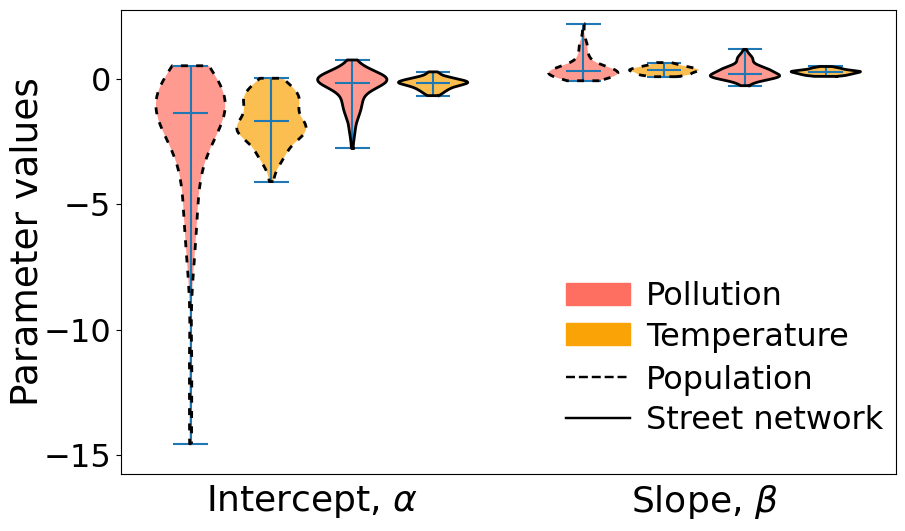

In [424]:
def filter_outliers(data, lower_percentile=5, upper_percentile=95):
    data_array = np.array(data)
    lower_bound = np.percentile(data_array, lower_percentile)
    upper_bound = np.percentile(data_array, upper_percentile)
    return data_array[(data_array >= lower_bound) & (data_array <= upper_bound)].tolist()

# filtering
ALPHAs_popu    = filter_outliers(ALPHAs_popu)
BETAs_popu     = filter_outliers(BETAs_popu)
ALPHAs_popu_T  = filter_outliers(ALPHAs_popu_T)
BETAs_popu_T   = filter_outliers(BETAs_popu_T)
ALPHAs_node    = filter_outliers(ALPHAs_node)
BETAs_node     = filter_outliers(BETAs_node)
ALPHAs_node_T  = filter_outliers(ALPHAs_node_T)
BETAs_node_T   = filter_outliers(BETAs_node_T)

data = [
    ALPHAs_popu,    ALPHAs_popu_T,    ALPHAs_node,    ALPHAs_node_T,
    BETAs_popu,     BETAs_popu_T,     BETAs_node,     BETAs_node_T
]

positions = [0.2, 0.55, 0.9, 1.25, 1.9, 2.25, 2.6, 2.95]

violin_colors = ['#ff6f61', '#faa307'] * 4

fig, ax = plt.subplots(figsize=(10, 8))
parts = ax.violinplot(data, positions=positions, widths=0.3, showmedians=True)

for i, body in enumerate(parts['bodies']):
    body.set_facecolor(violin_colors[i])
    body.set_alpha(0.7)
    
    if i in [0, 1, 4, 5]:
        body.set_edgecolor('none')
        for path in body.get_paths():
            vertices = path.vertices
            ax.plot(vertices[:, 0], vertices[:, 1],
                    linestyle=(0, (2.5, 3)), color='black', linewidth=2)
    else:
        body.set_edgecolor('none')
        for path in body.get_paths():
            vertices = path.vertices
            ax.plot(vertices[:, 0], vertices[:, 1],
                    linestyle='-', color='black', linewidth=2)

import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

legend1_handles = [
    mpatches.Patch(color='#ff6f61', label='Pollution'),
    mpatches.Patch(color='#faa307', label='Temperature')
]
pop_handle = Line2D([0], [0], color='black', lw=1.75, linestyle='--', label='Population')
sn_handle  = Line2D([0], [0], color='black', lw=1.75, linestyle='-',  label='Street network')

x_legend = 0.55

legend1 = ax.legend(
    handles=legend1_handles,
    loc='lower left',                     
    bbox_to_anchor=(x_legend, 0.22),       
    bbox_transform=ax.transAxes,
    fontsize=23,
    frameon=False,                        
    borderpad=0.1,                         
    handletextpad=0.5,                     
    labelspacing=0.3,                      
    columnspacing=1                        
)

legend1._legend_box.align = "left"
for txt in legend1.get_texts():
    txt.set_ha('left')
ax.add_artist(legend1)


legend2 = ax.legend(
    handles=[pop_handle, sn_handle],
    loc='lower left',
    bbox_to_anchor=(x_legend, 0.04),       # misma x, pero y=0.05
    bbox_transform=ax.transAxes,
    fontsize=23,
    frameon=False,
    borderpad=0.1,
    handlelength=2,
    handletextpad=0.5,
    labelspacing=0.3,
    columnspacing=1
)
legend2._legend_box.align = "left"
for txt in legend2.get_texts():
    txt.set_ha('left')

ax.set_ylabel('Parameter values', fontsize=27, labelpad=-2)
ax.set_ylim(-15.75, 2.75)
plt.yticks([-15,-10, -5, 0], fontsize=23)

ax.set_xticks([])

subgroup_center_1 = (0.2 + 0.55) / 2 - 0.025  
subgroup_center_2 = (0.9 + 1.25) / 2 + 0.025    
intercept_center = (subgroup_center_1 + subgroup_center_2) / 2

subgroup_center_3 = (1.9 + 2.25) / 2 - 0.025    
subgroup_center_4 = (2.6 + 2.95) / 2 + 0.025   
slope_center = (subgroup_center_3 + subgroup_center_4) / 2

plt.subplots_adjust(bottom=0.3)
ax.text(intercept_center, -0.02, r'Intercept, $\alpha$', ha='center', va='top',
        transform=ax.get_xaxis_transform(), fontsize=26)
ax.text(slope_center, -0.02, r'Slope, $\beta$', ha='center', va='top',
        transform=ax.get_xaxis_transform(), fontsize=26)

# plt.savefig('node_population_parameter_comparison_PM' + PM + '_T_' + size + '.svg', format='svg', dpi=600, bbox_inches='tight')

plt.show()


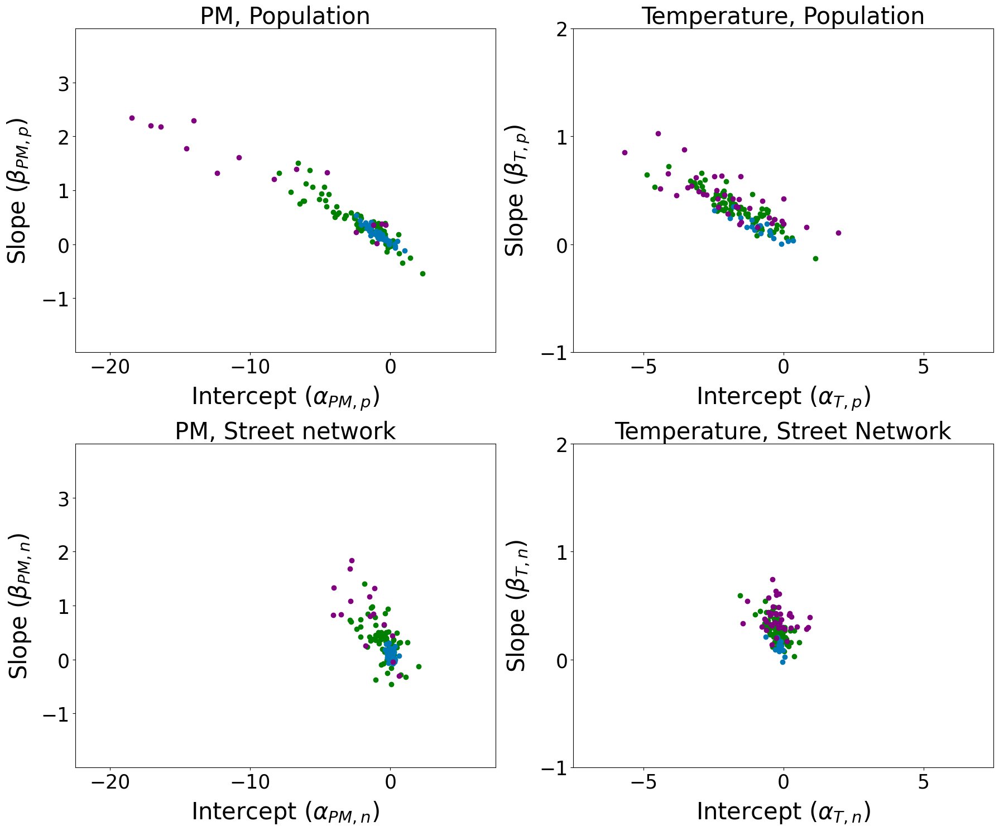

In [425]:
fig, axes = plt.subplots(2, 2, figsize=(18, 15))
tick_params = dict(axis='both', labelsize=25)

# --- Subplot 1: PM, Population 
ax = axes[0, 0]
for cluster_id, city_list in clusters_PM.items():
    alphas = []
    betas = []
    for city in city_list:
        coef = coefficients_p_PM_dic.get(city)
        if coef is not None and not coef.empty:
            alpha = coef['intersection'].iloc[0]
            beta  = coef['slope'].iloc[0]
            if np.isnan(alpha) or np.isnan(beta):
                print(f"Missing data for {city} (Cluster {cluster_id}, PM, pop).")
            else:
                # Keep only if -20 <= alpha <= 5
                if -20 <= alpha <= 5:
                    alphas.append(alpha)
                    betas.append(beta)
        else:
            print(f"No coefficient data for {city} (Cluster {cluster_id}, PM, pop).")
    ax.scatter(alphas, betas, color=cluster_colors[cluster_id], label=f'Cluster {cluster_id}', alpha=1)
ax.set_xlabel(r'Intercept $(\alpha_{PM,p})$', fontsize=30, labelpad=10)
ax.set_ylabel(r'Slope $(\beta_{PM,p})$', fontsize=30, labelpad=10)
ax.set_xlim(-22.5, 7.5)
ax.set_ylim(-2, 4)
ax.set_xticks([-20, -10, 0])
ax.set_yticks([-1, 0, 1, 2, 3])
ax.tick_params(**tick_params)
ax.set_title('PM, Population', fontsize=30)

# --- Subplot 2: Temperature, Population 
ax = axes[0, 1]
for cluster_id, city_list in clusters_T.items():
    alphas = []
    betas = []
    for city in city_list:
        coef = coefficients_p_T_dic.get(city)
        if coef is not None and not coef.empty:
            alpha = coef['intersection'].iloc[0]
            beta  = coef['slope'].iloc[0]
            if np.isnan(alpha) or np.isnan(beta):
                print(f"Missing data for {city} (Cluster {cluster_id}, Temp, pop).")
            else:
                # Keep only if alpha >= -15
                if alpha >= -15:
                    alphas.append(alpha)
                    betas.append(beta)
        else:
            print(f"No coefficient data for {city} (Cluster {cluster_id}, Temp, pop).")
    ax.scatter(alphas, betas, color=cluster_colors[cluster_id], label=f'Cluster {cluster_id}', alpha=1)
ax.set_xlabel(r'Intercept $(\alpha_{T,p})$', fontsize=30, labelpad=10)
ax.set_ylabel(r'Slope $(\beta_{T,p})$', fontsize=30, labelpad=10)
ax.set_xlim(-7.5, 7.5)
ax.set_ylim(-1, 2)
ax.set_xticks([-5, 0, 5])
ax.set_yticks([-1, 0, 1, 2])
ax.tick_params(**tick_params)
# ax.legend(fontsize=22)
ax.set_title('Temperature, Population', fontsize=30)

# --- Subplot 3: PM, Node 
ax = axes[1, 0]
for cluster_id, city_list in clusters_PM.items():
    alphas = []
    betas = []
    for city in city_list:
        coef = coefficients_PM_dic.get(city)
        if coef is not None and not coef.empty:
            alpha = coef['intersection'].iloc[0]
            beta  = coef['slope'].iloc[0]
            if np.isnan(alpha) or np.isnan(beta):
                print(f"Missing data for {city} (Cluster {cluster_id}, PM, node).")
            else:
                # Filter out PM, node: remove if alpha is close to -7.490711113748627 and keep only if -20 <= alpha <= 5
                if (not np.isclose(alpha, -7.490711113748627, atol=1e-8)) and (-20 <= alpha <= 5):
                    alphas.append(alpha)
                    betas.append(beta)
        else:
            print(f"No coefficient data for {city} (Cluster {cluster_id}, PM, node).")
    ax.scatter(alphas, betas, color=cluster_colors[cluster_id], label=f'Cluster {cluster_id}', alpha=1)
ax.set_xlabel(r'Intercept $(\alpha_{PM,n})$', fontsize=30, labelpad=10)
ax.set_ylabel(r'Slope $(\beta_{PM,n})$', fontsize=30, labelpad=10)
ax.set_xlim(-22.5, 7.5)
ax.set_ylim(-2, 4)
ax.set_xticks([-20, -10, 0])
ax.set_yticks([-1, 0, 1, 2, 3])
ax.tick_params(**tick_params)
ax.set_title('PM, Street network', fontsize=30)

# --- Subplot 4: Temperature, Node 
ax = axes[1, 1]
for cluster_id, city_list in clusters_T.items():
    alphas = []
    betas = []
    for city in city_list:
        coef = coefficients_T_dic.get(city)
        if coef is not None and not coef.empty:
            alpha = coef['intersection'].iloc[0]
            beta  = coef['slope'].iloc[0]
            if np.isnan(alpha) or np.isnan(beta):
                print(f"Missing data for {city} (Cluster {cluster_id}, Temp, node).")
            else:
                # No additional filtering for Temperature, node coefficients
                alphas.append(alpha)
                betas.append(beta)
        else:
            print(f"No coefficient data for {city} (Cluster {cluster_id}, Temp, node).")
    ax.scatter(alphas, betas, color=cluster_colors[cluster_id], label=f'Cluster {cluster_id}', alpha=1)
ax.set_xlabel(r'Intercept $(\alpha_{T,n})$', fontsize=30, labelpad=10)
ax.set_ylabel(r'Slope $(\beta_{T,n})$', fontsize=30, labelpad=10)
ax.set_xlim(-7.5, 7.5)
ax.set_ylim(-1, 2)
ax.set_xticks([-5, 0, 5])
ax.set_yticks([-1, 0, 1, 2])
ax.tick_params(**tick_params)
ax.set_title('Temperature, Street Network', fontsize=30)

plt.tight_layout()
# plt.savefig('alpha_vs_slope.svg', format='svg', dpi=600, bbox_inches='tight')
plt.show()


# TEMPERATURE DISTRIBUTIONS

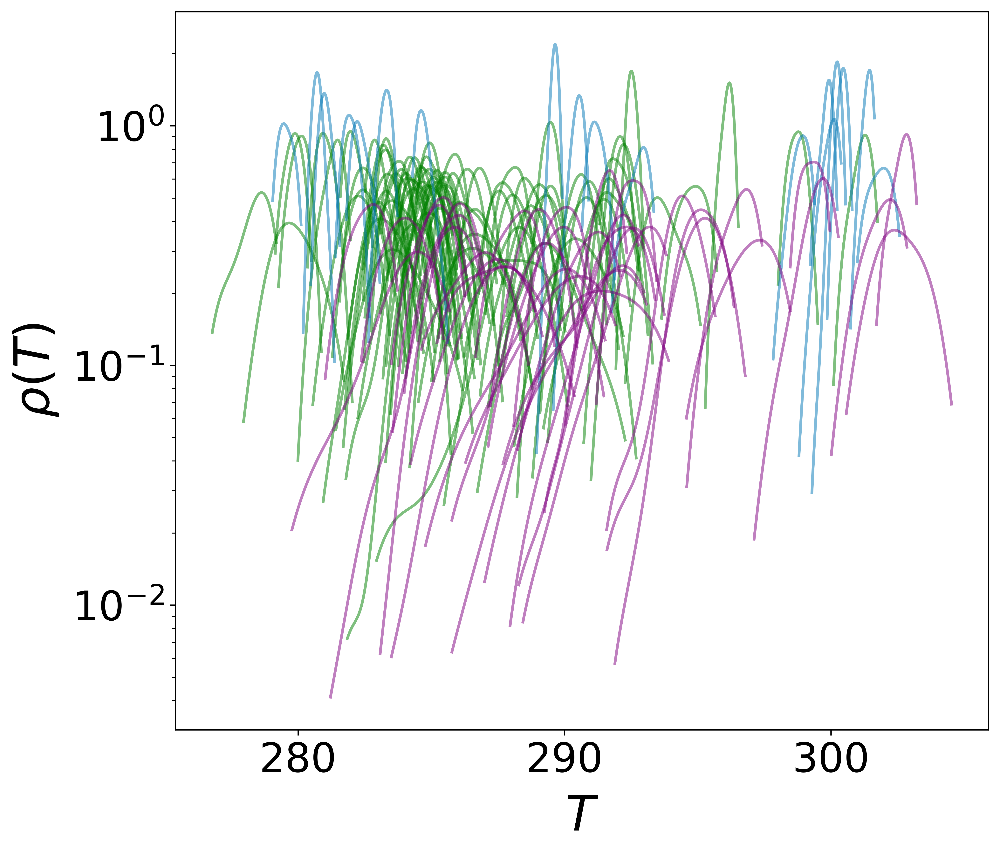

In [426]:
def automate_pdf_plotting(
    pop_T_NETWORK_dic, 
    clusters_T, 
    cluster_colors, 
    bw_method=0.75, 
    step=0.005,
    lower_pct=1,   
    upper_pct=100):

    kde_dic = {}
    y_kde_dic = {}
    TEMP_points_dic = {}
    
    for cluster_id, city_list in clusters_T.items():
        for city in city_list:
            
            T_data = np.array(pop_T_NETWORK_dic[city]['T'])
            
            # --- 1) remove tails ---
            low_val = np.percentile(T_data, lower_pct)
            high_val = np.percentile(T_data, upper_pct)
            T_data_clipped = T_data[(T_data >= low_val) & (T_data <= high_val)]

            if len(T_data_clipped) < 2:
                T_data_clipped = T_data

            # --- 2) Compute Gaussian KDE ---
            kde = gaussian_kde(T_data_clipped, bw_method=bw_method)
            kde_dic[city] = kde

            temp_min, temp_max = T_data_clipped.min(), T_data_clipped.max()
            if temp_min == temp_max:
                temp_min -= 1
                temp_max += 1

            bins = int((temp_max - temp_min) / step) if temp_max > temp_min else 50
            bins = max(bins, 50)
            TEMP_points = np.linspace(temp_min, temp_max, bins)
            TEMP_points_dic[city] = TEMP_points
            
            y_kde = kde(TEMP_points)
            y_kde_dic[city] = y_kde
            continue
    
    # --- 3) Plotting ---
    fig, ax = plt.subplots(figsize=(9, 8), dpi=600)
    
    for cluster_id, city_list in clusters_T.items():
        color = cluster_colors.get(cluster_id, 'grey')
        for city in city_list:
            if city in TEMP_points_dic and city in y_kde_dic:
                ax.plot(
                    TEMP_points_dic[city], 
                    y_kde_dic[city], 
                    color=color, 
                    alpha=0.5, 
                    linewidth=1.7, 
                    markersize=1.5, 
                    label=city
                )
    
    ax.set_ylabel(r'$\rho(T)$', size=30, labelpad=8)
    ax.set_xlabel(r'$T$', size=30, labelpad=8)
    ax.set_yscale('log', base=10)

    plt.xticks([280, 290, 300]) 
    plt.tick_params(axis='x', labelsize=25) 
    plt.tick_params(axis='y', labelsize=25)

    # (Optional) legend, saving, etc.
    plt.savefig('T'+T_type+ '_pdf_clusters_'+size+'.svg', format='svg', dpi=600, bbox_inches='tight')

    plt.show()
    return y_kde_dic

y_kde_dic = automate_pdf_plotting(pop_T_NETWORK_dic, clusters_T, cluster_colors, bw_method=0.65, step=0.005)

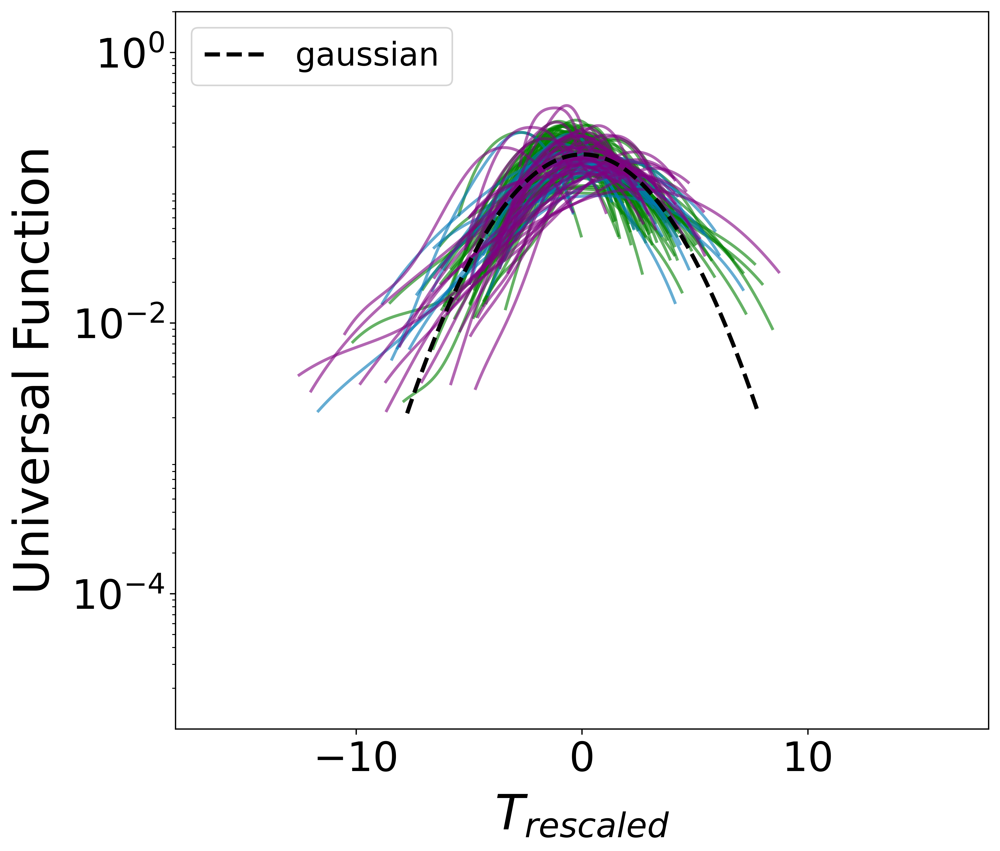

In [453]:
# CLUSTERING

def gaussian(x, amp, mu, sigma):
    return (amp / (sigma * np.sqrt(2*np.pi))) * np.exp(-0.5 * ((x - mu)/sigma)**2)

def automate_pdf_plotting_normalized(
    pop_T_NETWORK_dic, clusters_T, cluster_colors, 
    OUTSIDE_TEMP_dic, mean_ALPHAs_T, mean_BETAs_T, std_residuals_T,
    gamma=1, bw_method=0.5, step=0.005,
    lower_pct=1, upper_pct=100):
    
    Y_kde_dic = {}
    X_kde_dic = {}

    phi = gamma
    
    all_X_vals = []
    all_Y_vals = []

    for cluster_id, city_list in clusters_T.items():
        if cluster_id in [1,2,3]:
            mean_alpha = mean_ALPHAs_T.get(cluster_id)
            mean_beta = mean_BETAs_T.get(cluster_id)
            mean_std_residual = std_residuals_T.get(cluster_id, [])
            mean_std_residual_node = np.mean(mean_std_residual) if len(mean_std_residual) else 0
            
            for city in city_list:
                
                T_data = np.array(pop_T_NETWORK_dic[city]['T'])

                # ---- 1) remove outliers ----
                low_val = np.percentile(T_data, lower_pct)
                high_val = np.percentile(T_data, upper_pct)
                T_data_clipped = T_data[(T_data >= low_val) & (T_data <= high_val)]

                # ---- 2) compute KDE ----
                kde = gaussian_kde(T_data_clipped, bw_method=bw_method)
                
                temp_min, temp_max = T_data_clipped.min(), T_data_clipped.max()
                bins = int((temp_max - temp_min) / step) if temp_max > temp_min else 50
                TEMP_points = np.linspace(temp_min, temp_max, max(bins, 50))
                
                y_kde = kde(TEMP_points)

                # ---- 3) rescaling X & Y ----
                T_outside_mean = OUTSIDE_TEMP_dic[city]['T'].mean()
                T_predicted = mean_alpha + mean_beta * pop_T_NETWORK_dic[city]['lognode'].mean()
                
                scaling_factor_X = (np.sqrt(mean_beta**2 * pop_T_NETWORK_dic[city]['lognode'].std()**2) ) ** phi
                X_normalized = (TEMP_points - T_outside_mean - T_predicted) / scaling_factor_X

                scaling_factor_Y = scaling_factor_X 
                y_kde_normalized = y_kde * scaling_factor_Y

                X_kde_dic[city] = X_normalized
                Y_kde_dic[city] = y_kde_normalized

                mask = y_kde_normalized > 0
                all_X_vals.extend(X_normalized[mask])
                all_Y_vals.extend(y_kde_normalized[mask])

    # ---- 4) fit a global Gaussian ----
    all_X_vals = np.array(all_X_vals)
    all_Y_vals = np.array(all_Y_vals)
    
    p0 = [1.0, 0.0, 1.0]  # initial guess
    popt, pcov = curve_fit(gaussian, all_X_vals, all_Y_vals, p0=p0)
    amp_fit, mu_fit, sigma_fit = popt

    x_fit = np.linspace(all_X_vals.min(), all_X_vals.max(), 1000)
    best_fit_curve = gaussian(x_fit, amp_fit, mu_fit, sigma_fit)

    fig, ax = plt.subplots(figsize=(9, 8), dpi=600)
    
    for cluster_id, city_list in clusters_T.items():
        color = cluster_colors.get(cluster_id, 'grey')
        for city in city_list:
            if city in X_kde_dic and city in Y_kde_dic:
                ax.plot(X_kde_dic[city], Y_kde_dic[city], color=color, alpha=0.6, linewidth=1.8)

    lowest_y = 0.00215
    mask_fit = best_fit_curve >= lowest_y
    ax.plot(x_fit[mask_fit], best_fit_curve[mask_fit], 'k--', linewidth=2.55, label='gaussian')
    
    ax.set_ylabel(r'Universal Function', size=30, labelpad=8) #$ \sigma_{T}(n)^{\gamma} \rho(T)$
    ax.set_xlabel(r'$T_{rescaled}$', size=30, labelpad=8) #$\frac{(T - T_0) - \langle \Delta T(n) \rangle}{\sigma_{T}(n)^{\phi}}$
    ax.set_yscale('log', base=10)

    plt.xlim(-18, 18)
    plt.ylim(1e-5, 2)
    plt.xticks([-10,0,10])
    plt.yticks([0.0001,0.01,1])
    plt.tick_params(axis='x', labelsize=25) 
    plt.tick_params(axis='y', labelsize=25) 
    plt.legend(fontsize=20, loc='upper left')

    plt.savefig('T'+T_type+'_pdf_normalized_node_clusters_'+size+'.svg', format='svg', dpi=600, bbox_inches='tight')
    plt.show()

    return

automate_pdf_plotting_normalized(pop_T_NETWORK_dic, clusters_T, cluster_colors, 
                                     OUTSIDE_TEMP_dic, mean_ALPHAs_T, mean_BETAs_T, 
                                     std_residuals_T, gamma=1, bw_method=0.7, step=0.01)

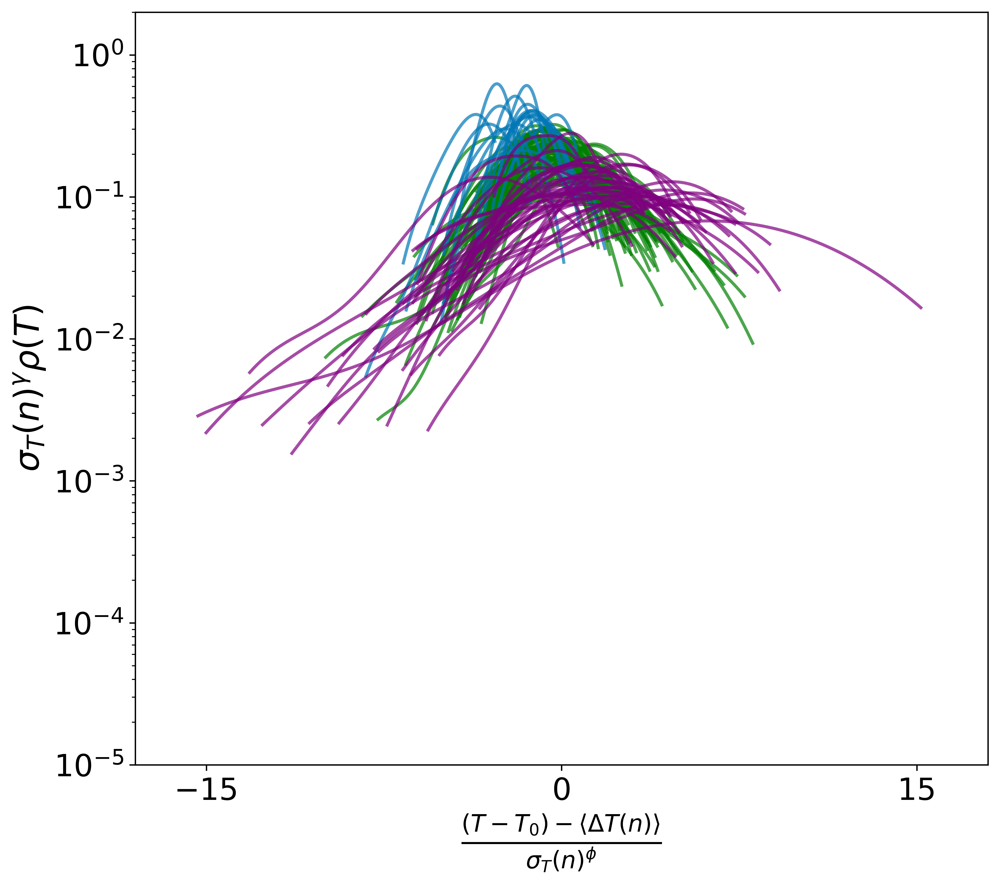

In [428]:
# NO CLUSTERING

def automate_pdf_plotting_normalized(
    pop_T_NETWORK_dic, clusters_T, cluster_colors, 
    OUTSIDE_TEMP_dic, b=1, bw_method=0.5, step=0.005,
    lower_pct=1, upper_pct=100):
    
    Y_kde_dic = {}
    X_kde_dic = {}

    phi = b

    for cluster_id, city_list in clusters_T.items():
        if cluster_id in [1,2,3]: #
            for city in city_list:
                T_data = np.array(pop_T_NETWORK_dic[city]['T'])

                # --- 1) remove outliers ---
                low_val = np.percentile(T_data, lower_pct)
                high_val = np.percentile(T_data, upper_pct)
                T_data_clipped = T_data[(T_data >= low_val) & (T_data <= high_val)]

                # --- 2) Compute KDE ---
                kde = gaussian_kde(T_data_clipped, bw_method=bw_method)

                temp_min, temp_max = T_data_clipped.min(), T_data_clipped.max()
                if temp_min == temp_max:  # fallback if data is all the same
                    temp_min -= 1
                    temp_max += 1
                bins = int((temp_max - temp_min) / step) if temp_max > temp_min else 50
                bins = max(bins, 50)  # ensure at least 50 points
                TEMP_points = np.linspace(temp_min, temp_max, bins)
                
                y_kde = kde(TEMP_points)

                # --- 3) rescaling X & Y---
                T_outside_mean = OUTSIDE_TEMP_dic[city]['T'].mean()
                T_predicted = np.mean(ALPHAs_node_T) + np.mean(BETAs_node_T) * pop_T_NETWORK_dic[city]['lognode'].mean()
                
                scaling_factor_X = (np.sqrt(np.mean(BETAs_node_T)**2 * pop_T_NETWORK_dic[city]['lognode'].std()**2) ) ** phi 
                X_normalized = (TEMP_points - T_outside_mean - T_predicted) / scaling_factor_X

                scaling_factor_Y = scaling_factor_X
                y_kde_normalized = y_kde * scaling_factor_Y
                
                Y_kde_dic[city] = y_kde_normalized
                X_kde_dic[city] = X_normalized

        else:
            continue

    # --- 4) plot ---
    fig, ax = plt.subplots(figsize=(9, 8), dpi=600)
    
    for cluster_id, city_list in clusters_T.items():
        color = cluster_colors.get(cluster_id, 'grey')  
        for city in city_list:
            if city in X_kde_dic and city in Y_kde_dic:
                ax.plot(X_kde_dic[city], Y_kde_dic[city], color=color, alpha=0.7, linewidth=1.8, label=city)
    
    ax.set_ylabel(r'$ \sigma_{T}(n)^{\gamma} \rho(T)$', size=20)
    ax.set_xlabel(r'$\frac{(T - T_0) -  \langle \Delta T(n) \rangle}{\sigma_{T}(n)^{\phi}}$', size=20)
    ax.set_yscale('log', base=10)

    plt.tick_params(axis='x', labelsize=18) 
    plt.tick_params(axis='y', labelsize=18) 

    plt.xlim(-18, 18)
    plt.xticks([-15,0,15])
    plt.ylim(1e-5, 2)
    plt.savefig('T'+T_type+'_pdf_normalized_node_no_groups_'+size+'.svg', format='svg', dpi=600, bbox_inches='tight')
    
    plt.show()

    return X_kde_dic, Y_kde_dic

X_kde_dic, Y_kde_dic = automate_pdf_plotting_normalized(pop_T_NETWORK_dic, clusters_T, cluster_colors, 
                                     OUTSIDE_TEMP_dic, b=1, bw_method=0.7, step=0.01)

# JOINT DISTRIBUTION T and n

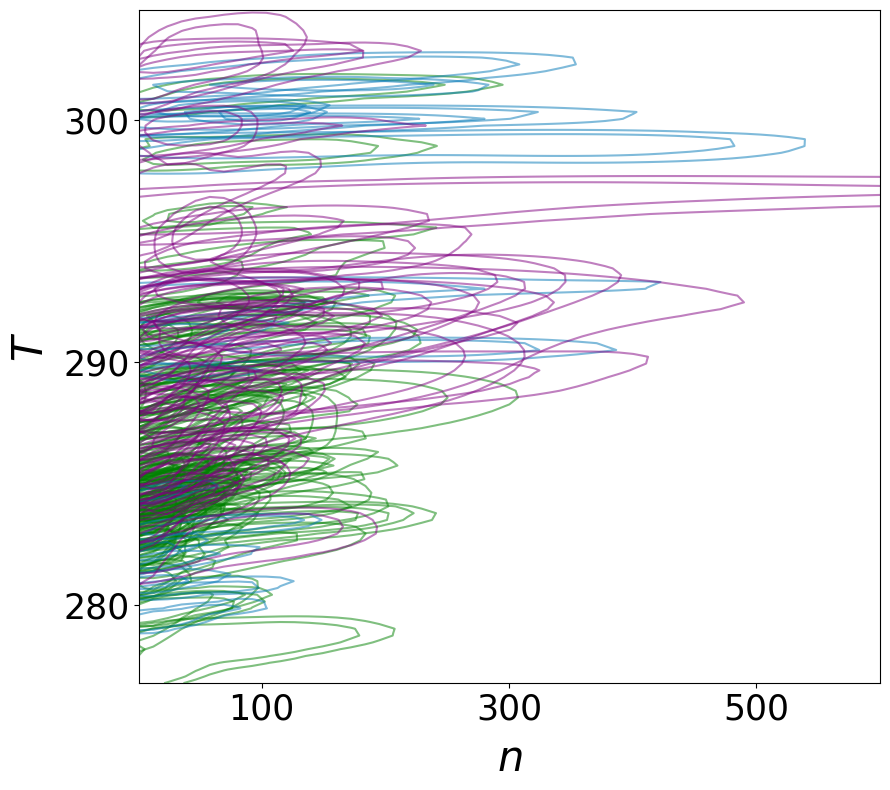

In [429]:
def plot_non_aggregated_fixed_levels(pop_T_NETWORK_dic,
                                     clusters_T,
                                     cluster_colors,
                                     bw_method=0.5,
                                     num_bins=50):
    
    all_n = np.concatenate([pop_T_NETWORK_dic[c]['node']
                            for cl in clusters_T.values() for c in cl])
    all_T = np.concatenate([pop_T_NETWORK_dic[c]['T']
                            for cl in clusters_T.values() for c in cl])

    n_min, n_max = all_n.min(), all_n.max()
    T_min, T_max = all_T.min(), all_T.max()

    n_pts = np.linspace(n_min, n_max, num_bins)
    T_pts = np.linspace(T_min, T_max, num_bins)
    n_grid, T_grid = np.meshgrid(n_pts, T_pts)
    grid_pos = np.vstack([n_grid.ravel(), T_grid.ravel()])

    fixed_levels = [0.20, 0.45]   
    lw = 1.5

    fig, ax = plt.subplots(figsize=(9, 8))

    for cid, city_list in clusters_T.items():
        color = cluster_colors.get(cid, 'gray')

        for city in city_list:
            n_vals = np.array(pop_T_NETWORK_dic[city]['node'])
            T_vals = np.array(pop_T_NETWORK_dic[city]['T'])

            kde = gaussian_kde(np.vstack([n_vals, T_vals]), bw_method=bw_method)
            rho = kde(grid_pos).reshape(n_grid.shape)

            rho = (rho - rho.min()) / (rho.max() - rho.min())

            ax.contour(
                n_grid, T_grid, rho,
                levels=fixed_levels,
                colors=[color]*len(fixed_levels),
                linewidths=lw,
                alpha=0.5
            )

    ax.set_xlabel(r'$n$', size=30, labelpad=8)
    ax.set_ylabel(r'$T$', size=30, labelpad=8)

    ax.set_xlim(n_min, 600)
    ax.set_ylim(T_min, T_max)
    ax.set_xticks([100, 300, 500])
    ax.set_yticks([280, 290, 300])

    ax.tick_params(axis='both', labelsize=25)
    plt.tight_layout()

    plt.savefig('node_joint_clusters_T'+T_type+'_'+size+'.svg', format='svg', dpi=600, bbox_inches='tight')
    plt.show()


plot_non_aggregated_fixed_levels(pop_T_NETWORK_dic,
                                 clusters_T,
                                 cluster_colors,
                                 bw_method=0.5,
                                 num_bins=100)


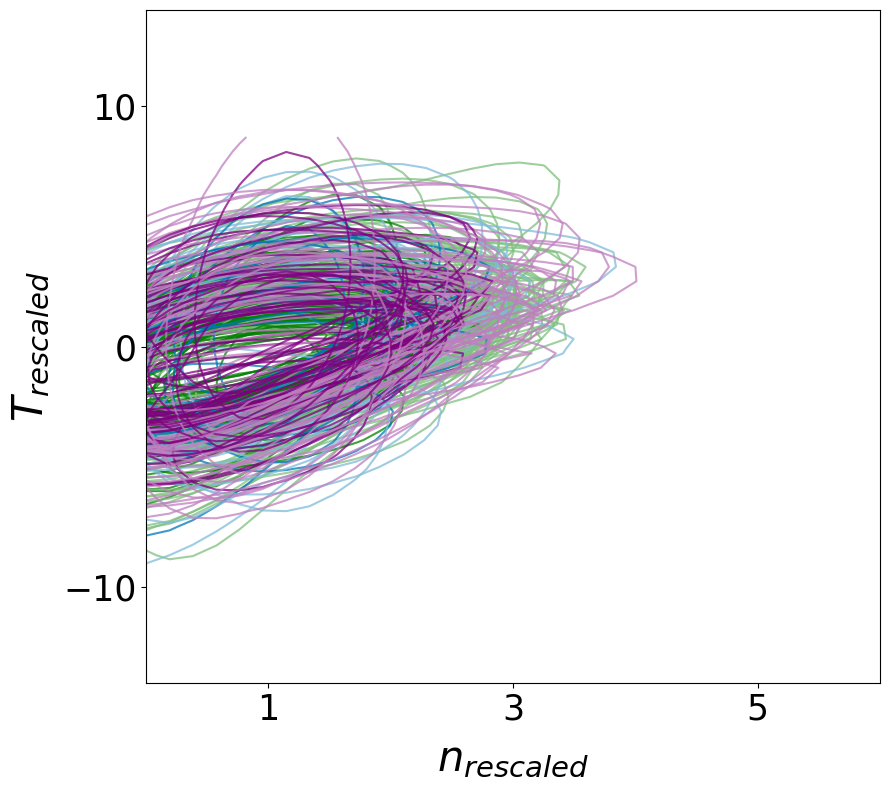

In [430]:
def plot_scaled_joint_pdf_fixed_levels(pop_T_NETWORK_dic, clusters_T, cluster_colors, 
                                       OUTSIDE_TEMP_dic, mean_ALPHAs_T, mean_BETAs_T, 
                                       std_residuals_T, phi=1, delta=1, bw_method=0.7, num_bins=100):
    fig, ax = plt.subplots(figsize=(9, 8))
    

    all_x_data = []
    all_y_data = []
    
    for cluster_id, city_list in clusters_T.items():
        mean_alpha = mean_ALPHAs_T.get(cluster_id, 0)
        mean_beta = mean_BETAs_T.get(cluster_id, 0)
        mean_std_residual = std_residuals_T.get(cluster_id, [0])
        mean_std_residual = np.mean(mean_std_residual) if mean_std_residual else 0
        
        for city in city_list:
            T_data = np.array(pop_T_NETWORK_dic[city]['T'])
            n_data = np.array(pop_T_NETWORK_dic[city]['node'])
            lognode_data = np.array(pop_T_NETWORK_dic[city]['lognode'])
            
            T0_k = OUTSIDE_TEMP_dic[city]['T'].mean()
            delta_T_k_mean = mean_alpha + mean_beta * lognode_data.mean()
            sigma_T_k = np.sqrt(mean_beta**2 * lognode_data.var() ) #+ mean_std_residual**2
            mean_n_k = n_data.mean()
            
            x_data = n_data / mean_n_k**delta
            y_data = (T_data - T0_k - delta_T_k_mean) / sigma_T_k**phi
            
            all_x_data.extend(x_data)
            all_y_data.extend(y_data)
    
    all_x_data = np.array(all_x_data)
    all_y_data = np.array(all_y_data)
    
    x_min, x_max = all_x_data.min(), all_x_data.max()
    y_min, y_max = all_y_data.min(), all_y_data.max()
    
    x_points = np.linspace(x_min, x_max, num_bins)
    y_points = np.linspace(y_min, y_max, num_bins)
    x_grid, y_grid = np.meshgrid(x_points, y_points)
    grid_positions = np.vstack([x_grid.ravel(), y_grid.ravel()])
    
    fixed_levels = [0, 0.2, 0.4]

    for cluster_id, city_list in clusters_T.items():

        base_color = cluster_colors.get(cluster_id, 'gray')
        custom_cmap = mcolors.LinearSegmentedColormap.from_list(
            f'custom_cmap_{cluster_id}', ['white', base_color], N =500)
        
        mean_alpha = mean_ALPHAs_T.get(cluster_id, 0)
        mean_beta = mean_BETAs_T.get(cluster_id, 0)
        mean_std_residual = std_residuals_T.get(cluster_id, [0])
        mean_std_residual = np.mean(mean_std_residual) if mean_std_residual else 0
        
        for city in city_list:
            T_data = np.array(pop_T_NETWORK_dic[city]['T'])
            n_data = np.array(pop_T_NETWORK_dic[city]['node'])
            lognode_data = np.array(pop_T_NETWORK_dic[city]['lognode'])
            
            T0_k = OUTSIDE_TEMP_dic[city]['T'].mean()
            delta_T_k_mean = mean_alpha + mean_beta * lognode_data.mean()
            sigma_T_k = np.sqrt(mean_beta**2 * lognode_data.var() ) #+ mean_std_residual**2
            mean_n_k = n_data.mean()
            
            x_data = n_data / mean_n_k**delta
            y_data = (T_data - T0_k - delta_T_k_mean) / sigma_T_k**phi
            
            values = np.vstack([x_data, y_data])
            kde = gaussian_kde(values, bw_method=bw_method)
            Z_scaled = np.reshape(kde(grid_positions), x_grid.shape)
            
            rho_norm = (Z_scaled - Z_scaled.min()) / (Z_scaled.max() - Z_scaled.min())
            
            ax.contour(x_grid, y_grid, rho_norm,
                       levels=fixed_levels,
                       cmap=custom_cmap,
                       alpha=0.75)
    

    ax.set_ylabel(r'$T_{rescaled}$', size=30, labelpad=8) 
    ax.set_xlabel(r'$n_{rescaled}$', size=30, labelpad=8) 
    ax.set_xlim(x_min, 6) 
    ax.set_ylim(-14, 14)
    
    plt.xticks([1, 3, 5])
    plt.yticks([-10, 0, 10])
    ax.tick_params(axis='x', labelsize=25)
    ax.tick_params(axis='y', labelsize=25)
    plt.tight_layout()
    
    plt.savefig('Collapse_node_joint_clusters_T'+T_type+'_vs_node_'+size+'.svg', format='svg', dpi=600, bbox_inches='tight')
    
    plt.show()

plot_scaled_joint_pdf_fixed_levels(pop_T_NETWORK_dic, clusters_T, cluster_colors, 
                                   OUTSIDE_TEMP_dic, mean_ALPHAs_T, mean_BETAs_T, 
                                   std_residuals_T, phi=1, delta=1, bw_method=0.7, num_bins=50)


# POLLUTION DISTRIBUTIONS

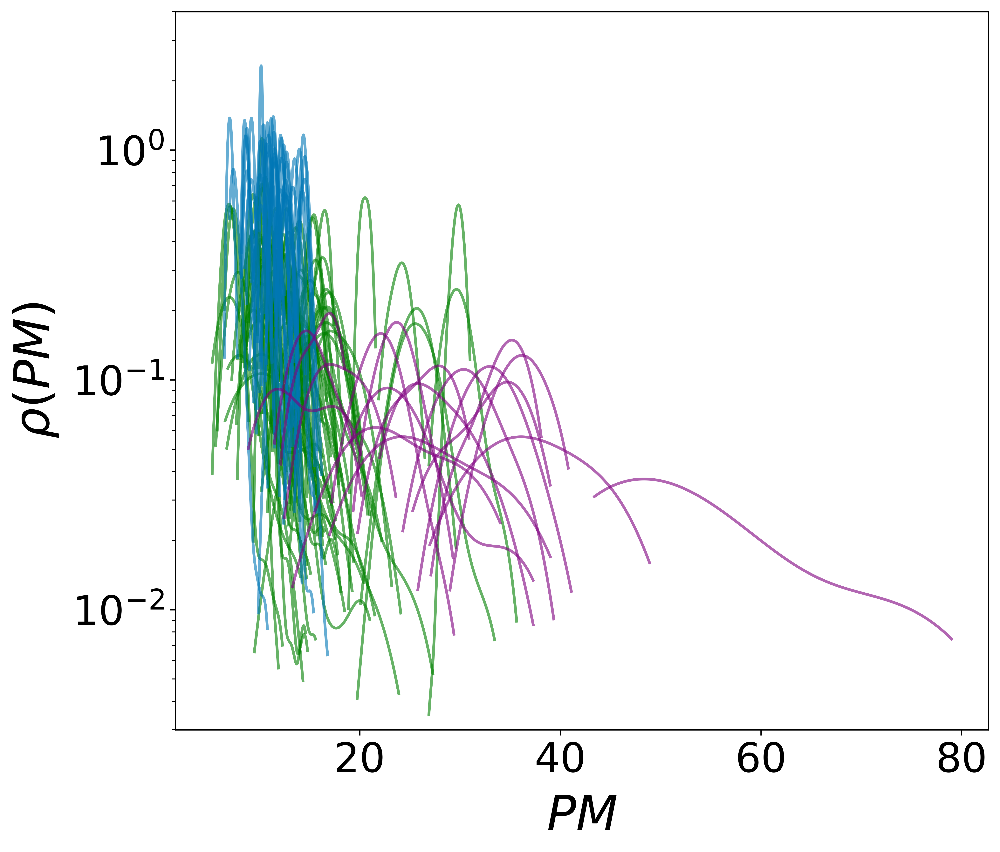

In [431]:
def automate_pdf_plotting(
    pop_T_NETWORK_dic, 
    clusters_PM, 
    cluster_colors, 
    bw_method=0.75, 
    step=0.005,
    lower_pct=0.1,   
    upper_pct=98):

    kde_dic = {}
    y_kde_dic = {}
    TEMP_points_dic = {}
    
    for cluster_id, city_list in clusters_PM.items():
        for city in city_list:
            T_data = np.array(pop_T_NETWORK_dic[city]['PM'+PM])
            
            # --- 1) remove outliers ---
            low_val = np.percentile(T_data, lower_pct)
            high_val = np.percentile(T_data, upper_pct)
            T_data_clipped = T_data[(T_data >= low_val) & (T_data <= high_val)]

            if len(T_data_clipped) < 2:
                T_data_clipped = T_data 
            
            # --- 2) Compute Gaussian KDE ---
            kde = gaussian_kde(T_data_clipped, bw_method=bw_method)
            kde_dic[city] = kde
            
            temp_min, temp_max = T_data_clipped.min(), T_data_clipped.max()
            if temp_min == temp_max:
                temp_min -= 1
                temp_max += 1
            bins = int((temp_max - temp_min) / step) if temp_max > temp_min else 50
            bins = max(bins, 50)  # ensure at least 50 points
            TEMP_points = np.linspace(temp_min, temp_max, bins)
            TEMP_points_dic[city] = TEMP_points
            
            y_kde = kde(TEMP_points)
            y_kde_dic[city] = y_kde
    
    # --- 3) Plotting ---
    fig, ax = plt.subplots(figsize=(9, 8), dpi=600)
    
    for cluster_id, city_list in clusters_PM.items():
        color = cluster_colors.get(cluster_id, 'grey')
        for city in city_list:
            if city in TEMP_points_dic and city in y_kde_dic:
                ax.plot(
                    TEMP_points_dic[city], 
                    y_kde_dic[city], 
                    color=color, 
                    alpha=0.6, 
                    linewidth=1.7, 
                    markersize=1.5, 
                    label=city
                )

    ax.set_ylabel(r'$\rho(PM)$', size=30, labelpad=8)
    ax.set_xlabel(r'$PM$', size=30, labelpad=8)
    ax.set_yscale('log', base=10)

    plt.tick_params(axis='x', labelsize=25) 
    plt.tick_params(axis='y', labelsize=25)

    plt.ylim(0.003,4)

    plt.savefig('PM' + PM + '_pdf_clusters_' + size + '.svg', format='svg', dpi=600, bbox_inches='tight')

    plt.show()
    
    return y_kde_dic

y_kde_dic = automate_pdf_plotting(pop_T_NETWORK_dic, clusters_PM, cluster_colors, bw_method=0.65, step=0.01)


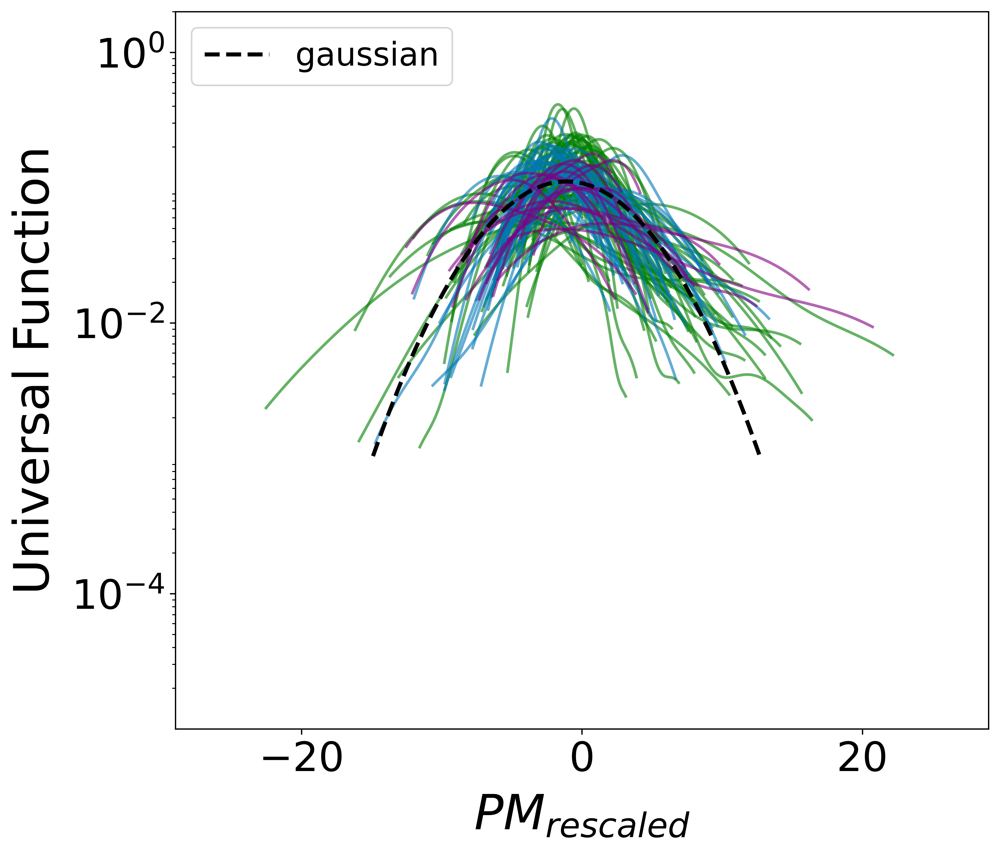

In [451]:
# CLUSTERING

def gaussian(x, amp, mu, sigma):
    return (amp / (sigma * np.sqrt(2*np.pi))) * np.exp(-0.5 * ((x - mu)/sigma)**2)

def automate_pdf_plotting_normalized(
    pop_T_NETWORK_dic, clusters_PM, cluster_colors, mean_ALPHAs_PM, mean_BETAs_PM, 
    std_residuals_PM, gamma=1.0, bw_method=0.5, step=0.01,
    lower_pct=0.1, upper_pct=95):
    Y_kde_dic = {}
    X_kde_dic = {}

    phi = gamma
    
    for cluster_id, city_list in clusters_PM.items():
        if cluster_id in [1,2,3]:   
            mean_alpha = mean_ALPHAs_PM.get(cluster_id)
            mean_beta  = mean_BETAs_PM.get(cluster_id)
            mean_std_residual = std_residuals_PM.get(cluster_id, [])
            mean_std_residual_node = np.mean(mean_std_residual) if len(mean_std_residual) else 0

            for city in city_list:
                T_data = np.array(pop_T_NETWORK_dic[city]['PM'+PM])

                # ----- 1) remove long tails -----
                low_val = np.percentile(T_data, lower_pct)
                high_val = np.percentile(T_data, upper_pct)
                T_data_clipped = T_data[(T_data >= low_val) & (T_data <= high_val)]

                # ----- 2) Compute the KDE -----
                kde = gaussian_kde(T_data_clipped, bw_method=bw_method)

                temp_min, temp_max = T_data_clipped.min(), T_data_clipped.max()
                bins = int((temp_max - temp_min) / step)
                TEMP_points = np.linspace(temp_min, temp_max, bins)
                y_kde = kde(TEMP_points)

                # ----- 3) rescaling X & Y
                    
                scaling_factor_Y = (
                    np.sqrt(mean_beta**2 * pop_T_NETWORK_dic[city]['lognode'].std()**2 )
                ) ** gamma
                PM_outside_mean = OUTSIDE_PM_dic[city]['PM'+PM].mean()
                T_predicted = mean_alpha + mean_beta * pop_T_NETWORK_dic[city]['lognode'].mean()
                scaling_factor_X = (
                    np.sqrt(mean_beta**2 * pop_T_NETWORK_dic[city]['lognode'].std()**2 )
                ) ** phi                    

                y_kde_normalized = y_kde * scaling_factor_Y
                X_normalized = (TEMP_points - PM_outside_mean - T_predicted) / scaling_factor_X

                Y_kde_dic[city] = y_kde_normalized 
                X_kde_dic[city] = X_normalized
        else:
            continue

    all_X, all_Y = [], []
    lowest_y = 0.02
    for city in X_kde_dic:
        mask = (Y_kde_dic[city] > lowest_y)
        all_X.extend(X_kde_dic[city][mask])
        all_Y.extend(Y_kde_dic[city][mask])

    all_X = np.array(all_X)
    all_Y = np.array(all_Y)

    p0 = [1.0, 0.0, 1.0]
    popt, pcov = curve_fit(gaussian, all_X, all_Y, p0=p0)
    amp_fit, mu_fit, sigma_fit = popt

    x_fit = np.linspace(all_X.min()-1, all_X.max(), 500)
    best_fit_curve = gaussian(x_fit, amp_fit, mu_fit, sigma_fit)

    # --- 4) Plotting ---
    fig, ax = plt.subplots(figsize=(9, 8), dpi=600)
    
    for cluster_id, city_list in clusters_PM.items():
        color = cluster_colors.get(cluster_id, 'grey')
        for city in city_list:
            if city in X_kde_dic and city in Y_kde_dic:        
                ax.plot(X_kde_dic[city], Y_kde_dic[city], color=color, alpha=0.6, linewidth=1.7)
    
    lowest_y_plot = 0.001
    mask_fit = best_fit_curve >= lowest_y_plot
    ax.plot(x_fit[mask_fit], best_fit_curve[mask_fit], 'k--', linewidth=2.5, label='gaussian')

    ax.set_ylabel(r'Universal Function', size=30, labelpad=8) #$ \sigma_{PM}(n)^{\gamma} \rho(PM)$
    ax.set_xlabel(r'$PM_{rescaled}$', size=30, labelpad=8) #\frac{(PM - PM_0) - \langle \Delta PM(n) \rangle}{\sigma_{PM}(n)^{\phi}}
    ax.set_yscale('log', base=10)
    plt.ylim(0.00001, 2)
    plt.xlim(-29, 29)
    plt.xticks([-20,0,20])
    plt.yticks([0.0001,0.01,1])
    plt.tick_params(axis='x', labelsize=25) 
    plt.tick_params(axis='y', labelsize=25) 
    plt.legend(fontsize=20, loc='upper left')
    
    plt.savefig('PM'+PM+'_pdf_normalized_node_clusters_'+size+'.svg', format='svg', dpi=600, bbox_inches='tight')
    plt.show()

    return
    
automate_pdf_plotting_normalized(pop_T_NETWORK_dic, clusters_PM, cluster_colors, 
                                     mean_ALPHAs_PM, mean_BETAs_PM, 
                                     std_residuals_PM, gamma=1.0, bw_method=0.7, step=0.01)

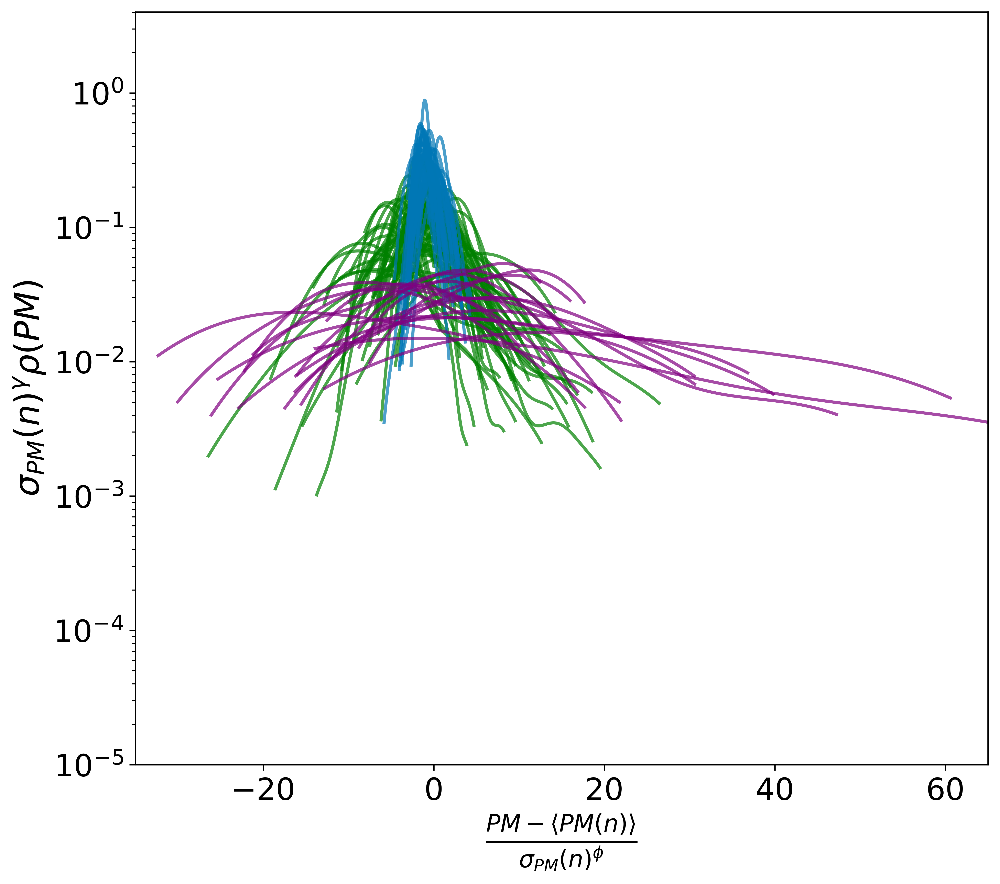

In [449]:
# NO CLUSTERING

def automate_pdf_plotting_normalized(
    pop_T_NETWORK_dic, clusters_PM, cluster_colors, 
    b=1, bw_method=0.5, step=0.005,
    lower_pct=0.1, upper_pct=95):

    Y_kde_dic = {}
    X_kde_dic = {}

    phi = b
    
    fig, ax = plt.subplots(figsize=(9, 8), dpi=600)

    for cluster_id, city_list in clusters_PM.items():

        color = cluster_colors.get(cluster_id, 'grey')
        
        for city in city_list:
            T_data = np.array(pop_T_NETWORK_dic[city]['PM'+PM])

            # --- 1) remove long tails ---
            low_val = np.percentile(T_data, lower_pct)
            high_val = np.percentile(T_data, upper_pct)
            T_data_clipped = T_data[(T_data >= low_val) & (T_data <= high_val)]

            # --- 2) Compute KDE ---
            kde = gaussian_kde(T_data_clipped, bw_method=bw_method)
            
            temp_min, temp_max = T_data_clipped.min(), T_data_clipped.max()
            if temp_min == temp_max: 
                temp_min -= 1
                temp_max += 1
            bins = int((temp_max - temp_min) / step) if (temp_max > temp_min) else 50
            bins = max(bins, 50) 
            TEMP_points = np.linspace(temp_min, temp_max, bins)
            
            y_kde = kde(TEMP_points)

            # --- 3) Renormalize X & Y ---
            T_outside_mean = OUTSIDE_PM_dic[city]['PM'+PM].mean()
            T_predicted = np.mean(ALPHAs_node) + np.mean(BETAs_node) * pop_T_NETWORK_dic[city]['lognode'].mean()
            scaling_factor_X = ( np.sqrt( np.mean(BETAs_node)**2 * pop_T_NETWORK_dic[city]['lognode'].std()**2) ) ** phi 
            X_normalized = (TEMP_points - T_outside_mean - T_predicted) / scaling_factor_X
            scaling_factor_Y = (
                np.sqrt(
                    np.mean(BETAs_node)**2 * pop_T_NETWORK_dic[city]['lognode'].std()**2 ) ) ** b 
            y_kde_normalized = y_kde * scaling_factor_Y

            Y_kde_dic[city] = y_kde_normalized
            X_kde_dic[city] = X_normalized

            # --- 4) Plot ---
            
            ax.plot(            X_normalized, y_kde_normalized, 
                   color=color, alpha=0.7, linewidth=1.8, label=city)
            
    ax.set_ylabel(r'$ \sigma_{PM}(n)^{\gamma} \rho(PM)$', size=20)
    ax.set_xlabel(r'$\frac{PM - \langle PM(n) \rangle}{\sigma_{PM}(n)^{\phi}}$', size=20)
    ax.set_yscale('log', base=10)

    plt.ylim(0.00001, 4)
    # plt.ylim(0.1,1)
    plt.xlim(-35, 65)
    plt.xticks([-20,0,20,40,60])
    plt.yticks([0.00001,0.0001,0.001,0.01,0.1,1])
    plt.tick_params(axis='x', labelsize=18) 
    plt.tick_params(axis='y', labelsize=18)

    plt.savefig('PM'+PM+'_pdf_normalized_node_no_clusters_'+size+'.svg', format='svg', dpi=600, bbox_inches='tight')
    plt.show()

    return X_kde_dic, Y_kde_dic

X_kde_dic, Y_kde_dic = automate_pdf_plotting_normalized(pop_T_NETWORK_dic, clusters_PM, cluster_colors, b=1, bw_method=0.7, step=0.01)

# PM and n JOINT DISTRIBUTION

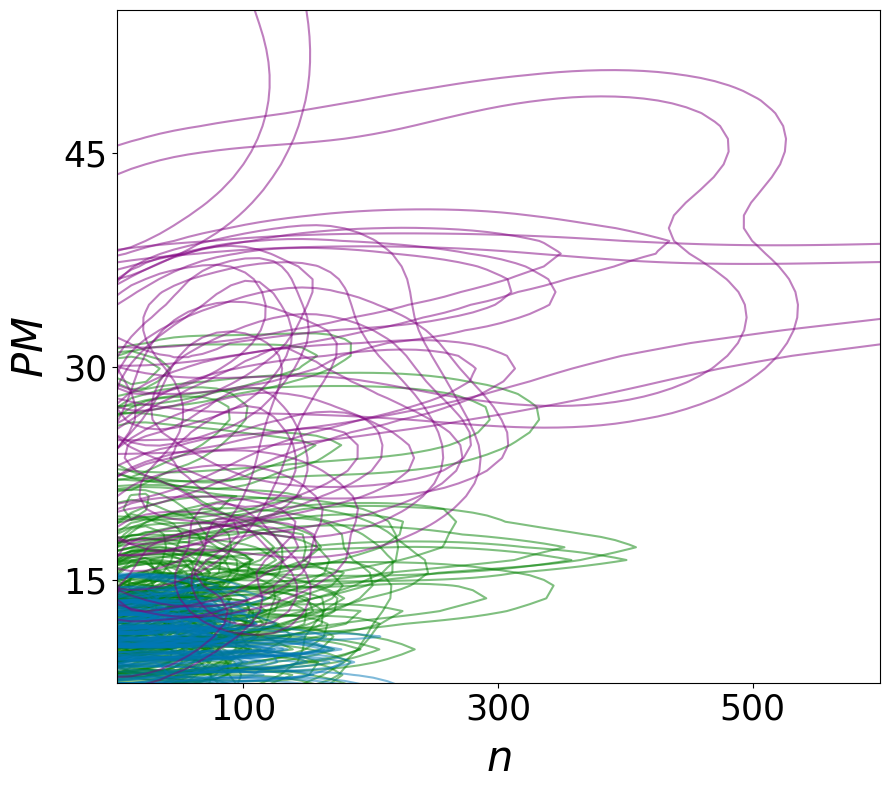

In [434]:
def plot_non_aggregated_fixed_levels_PM(pop_T_NETWORK_dic,
                                        clusters_PM,
                                        cluster_colors,
                                        bw_method=0.5,
                                        num_bins=100,
                                        PM='25'):

    all_n = np.concatenate([pop_T_NETWORK_dic[c]['node']
                            for cl in clusters_PM.values() for c in cl])
    all_PM = np.concatenate([pop_T_NETWORK_dic[c]['PM'+PM]
                             for cl in clusters_PM.values() for c in cl])

    n_min, n_max = all_n.min(), all_n.max()
    PM_min, PM_max = all_PM.min(), all_PM.max()

    n_pts = np.linspace(n_min, n_max, num_bins)
    PM_pts = np.linspace(PM_min, PM_max, num_bins)
    n_grid, PM_grid = np.meshgrid(n_pts, PM_pts)
    grid_pos = np.vstack([n_grid.ravel(), PM_grid.ravel()])

    fixed_levels = [0.20, 0.35]     
    lw = 1.5                       

    fig, ax = plt.subplots(figsize=(9, 8))

    for cid, city_list in clusters_PM.items():
        color = cluster_colors.get(cid, 'gray')

        for city in city_list:
            n_vals = np.array(pop_T_NETWORK_dic[city]['node'])
            PM_vals = np.array(pop_T_NETWORK_dic[city]['PM'+PM])

            kde = gaussian_kde(np.vstack([n_vals, PM_vals]), bw_method=bw_method)
            rho = kde(grid_pos).reshape(n_grid.shape)

            rho = (rho - rho.min()) / (rho.max() - rho.min())

            ax.contour(
                n_grid, PM_grid, rho,
                levels=fixed_levels,
                colors=[color]*len(fixed_levels),
                linewidths=lw,
                alpha=0.5
            )

    ax.set_xlabel(r'$n$', size=30, labelpad=8)
    ax.set_ylabel(r'$PM$', size=30, labelpad=8)

    ax.set_xlim(n_min, 600)                
    ax.set_ylim(PM_min+3, 55)
    ax.set_xticks([100, 300, 500])
    ax.set_yticks([15, 30, 45])

    ax.tick_params(axis='both', labelsize=25)
    plt.tight_layout()

    plt.savefig(f'node_joint_clusters_PM_{size}.svg', format='svg', dpi=600, bbox_inches='tight')
    plt.show()


plot_non_aggregated_fixed_levels_PM(pop_T_NETWORK_dic,
                                    clusters_PM,
                                    cluster_colors,
                                    bw_method=0.5,
                                    num_bins=100,
                                    PM='25')


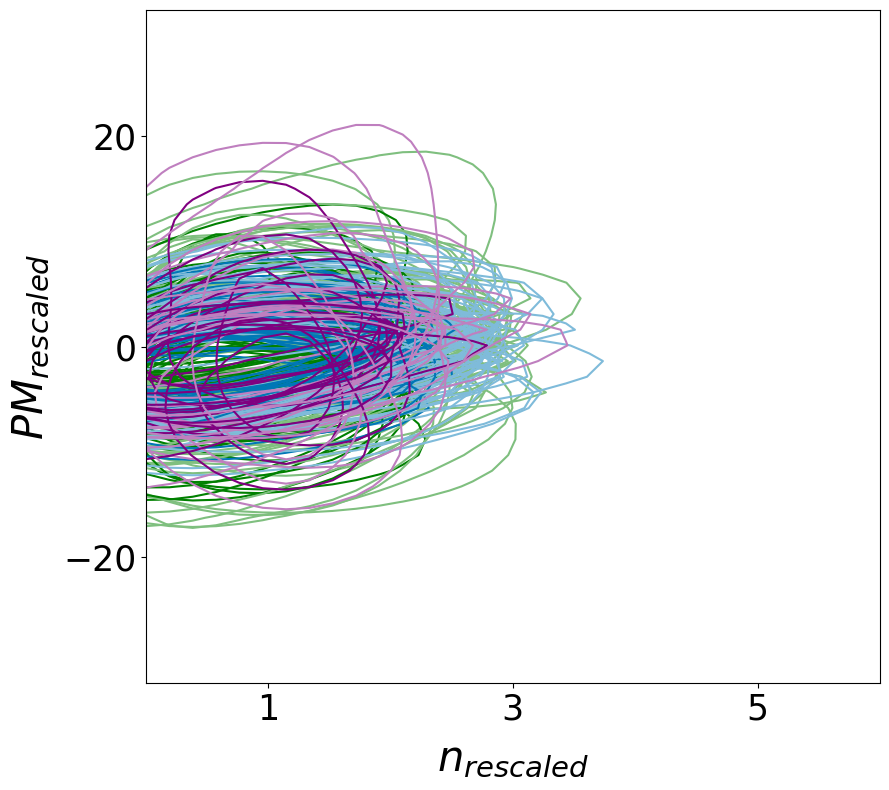

In [435]:
def plot_scaled_joint_pdf_fixed_levels_PM(pop_T_NETWORK_dic, clusters_PM, cluster_colors, 
                                            OUTSIDE_PM_dic, mean_ALPHAs_PM, mean_BETAs_PM, 
                                            std_residuals_PM, phi=1, delta=1, bw_method=0.7, 
                                            num_bins=50, PM='25'):

    fig, ax = plt.subplots(figsize=(9, 8))
    
    all_x_data = []
    all_y_data = []
    
    for cluster_id, city_list in clusters_PM.items():
        mean_alpha = mean_ALPHAs_PM.get(cluster_id, 0)
        mean_beta = mean_BETAs_PM.get(cluster_id, 0)
        mean_std_residual = std_residuals_PM.get(cluster_id, [0])
        mean_std_residual = np.mean(mean_std_residual) if mean_std_residual else 0
        
        for city in city_list:
            n_data = np.array(pop_T_NETWORK_dic[city]['node'])
            T_data = np.array(pop_T_NETWORK_dic[city]['PM' + PM])
            lognode_data = np.array(pop_T_NETWORK_dic[city]['lognode'])
            
            T0_k = OUTSIDE_PM_dic[city]['PM' + PM].mean()
            delta_T_k_mean = mean_alpha + mean_beta * lognode_data.mean()
            sigma_T_k = np.sqrt(mean_beta**2 * lognode_data.var() )
            mean_n_k = n_data.mean()

            x_data = n_data / mean_n_k**delta
            y_data = (T_data - T0_k - delta_T_k_mean) / sigma_T_k**phi
            
            all_x_data.extend(x_data)
            all_y_data.extend(y_data)
    
    all_x_data = np.array(all_x_data)
    all_y_data = np.array(all_y_data)
    x_min, x_max = all_x_data.min(), all_x_data.max()
    y_min, y_max = all_y_data.min(), all_y_data.max()
    
    x_points = np.linspace(x_min, x_max, num_bins)
    y_points = np.linspace(y_min, y_max, num_bins)
    x_grid, y_grid = np.meshgrid(x_points, y_points)
    grid_positions = np.vstack([x_grid.ravel(), y_grid.ravel()])
    
    fixed_levels = [0, 0.2, 0.4]
    
    for cluster_id, city_list in clusters_PM.items():

        base_color = cluster_colors.get(cluster_id, 'gray')
        custom_cmap = mcolors.LinearSegmentedColormap.from_list(
            f'custom_cmap_{cluster_id}', ['white', base_color], N=500)
        
        mean_alpha = mean_ALPHAs_PM.get(cluster_id, 0)
        mean_beta = mean_BETAs_PM.get(cluster_id, 0)
        mean_std_residual = std_residuals_PM.get(cluster_id, [0])
        mean_std_residual = np.mean(mean_std_residual) if mean_std_residual else 0
        
        for city in city_list:
            
            n_data = np.array(pop_T_NETWORK_dic[city]['node'])
            T_data = np.array(pop_T_NETWORK_dic[city]['PM' + PM])
            lognode_data = np.array(pop_T_NETWORK_dic[city]['lognode'])
            
            T0_k = OUTSIDE_PM_dic[city]['PM' + PM].mean()
            delta_T_k_mean = mean_alpha + mean_beta * lognode_data.mean()
            sigma_T_k = np.sqrt(mean_beta**2 * lognode_data.var() ) #+ mean_std_residual**2
            mean_n_k = n_data.mean()
            
            x_data = n_data / mean_n_k**delta
            y_data = (T_data - T0_k - delta_T_k_mean) / sigma_T_k**phi

            values = np.vstack([x_data, y_data])
            kde = gaussian_kde(values, bw_method=bw_method)
            Z_scaled = np.reshape(kde(grid_positions), x_grid.shape)
            
            rho_norm = (Z_scaled - Z_scaled.min()) / (Z_scaled.max() - Z_scaled.min())
            
            ax.contour(x_grid, y_grid, rho_norm,
                       levels=fixed_levels,
                       cmap=custom_cmap,
                       alpha=1)
        
    ax.set_ylabel(r'$PM_{rescaled}$', size=30, labelpad=8)
    ax.set_xlabel(r'$n_{rescaled}$', size=30, labelpad=8) 
    ax.set_xlim(x_min, 6) 
    ax.set_ylim(-32, 32)
    
    plt.xticks([1, 3, 5])
    plt.yticks([-20,0, 20])
    ax.tick_params(axis='x', labelsize=25)
    ax.tick_params(axis='y', labelsize=25)
    plt.tight_layout()

    plt.savefig('Collapse_node_joint_clusters_PM_vs_node_' + size + '.svg', format='svg', dpi=600, bbox_inches='tight')
    plt.show()


# Example usage:
plot_scaled_joint_pdf_fixed_levels_PM(pop_T_NETWORK_dic, clusters_PM, cluster_colors, 
                                        OUTSIDE_PM_dic, mean_ALPHAs_PM, mean_BETAs_PM, 
                                        std_residuals_PM, phi=1, delta=1, bw_method=0.7, 
                                        num_bins=50, PM='25')
